LINKEDIN JOB POSTINGS - KEYWORD ANALYSIS USING TOPIC MODELING (LDA)

I. IMPORT LIBRARIES & LOAD DATASET

In [263]:
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [264]:
# LOAD DATA
df = pd.read_csv(r'C:\Users\vul\Downloads\linkedin job postings.csv')
df.drop_duplicates()
df.info()
df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4995 entries, 0 to 4994
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   url          4995 non-null   object
 1   company      4995 non-null   object
 2   title        4995 non-null   object
 3   salary       3406 non-null   object
 4   location     4995 non-null   object
 5   description  4973 non-null   object
dtypes: object(6)
memory usage: 234.3+ KB


,url,company,title,salary,location,description
0,https://www.linkedin.com/jobs/view/4349682995?...,Major League Baseball (MLB),Intelligence Analyst,$72.5K/yr - $85K/yr,"New York, NY",The Intelligence Analyst for Major League Base...
1,https://www.linkedin.com/jobs/view/4326436968?...,KeyBank,2026 HR Analytics Rotational Analyst – Cleveland,$51K/yr - $78K/yr,"Brooklyn, OH (Remote)","Location:\n4900 Tiedeman Road, Brooklyn Ohio\n..."
2,https://www.linkedin.com/jobs/view/4349724945?...,DHL Supply Chain,Business Data Analyst I,$70K/yr - $115K/yr · 401(k) benefit,"Middletown, PA",The Business Data Analyst I role has a nationa...
3,https://www.linkedin.com/jobs/view/4326758467?...,Constellation,Associate Origination Analyst - New Grads 2026,$73.8K/yr - $82K/yr · 401(k) benefit,"Baltimore, MD (Hybrid)",Who We Are\nAs the nation's largest producer o...
4,https://www.linkedin.com/jobs/view/4326854819?...,The Hershey Company,"Analyst, People Insights",NaN,"Hershey, PA (Hybrid)","Location:\nHershey, PA or open to remote\nJob ..."


In [265]:
df = df.drop_duplicates(subset="url").reset_index(drop=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4406 entries, 0 to 4405
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   url          4406 non-null   object
 1   company      4406 non-null   object
 2   title        4406 non-null   object
 3   salary       3013 non-null   object
 4   location     4406 non-null   object
 5   description  4389 non-null   object
dtypes: object(6)
memory usage: 206.7+ KB


II. EDA 

In [266]:

# -----------------------------
# A) Dataset overview
# -----------------------------
n_posts = len(df)
n_companies = df[company_col].nunique(dropna=True) if company_col else np.nan
n_locations = df[location_col].nunique(dropna=True) if location_col else np.nan
pct_missing_salary = (df[salary_col].isna().mean() * 100) if salary_col else np.nan

print("\n--- Dataset overview ---")
print(f"Number of job postings: {n_posts:,}")
print(f"Number of unique companies: {n_companies:,}" if company_col else "Number of unique companies: (company column not found)")
print(f"Number of unique locations: {n_locations:,}" if location_col else "Number of unique locations: (location column not found)")
print(f"% missing salary: {pct_missing_salary:.1f}%" if salary_col else "% missing salary: (salary column not found)")

# Table: missing values by column
missing_tbl = (
    df.isna().mean()
      .mul(100)
      .sort_values(ascending=False)
      .rename("pct_missing")
      .to_frame()
)
print("\n--- Missing values by column (% missing) ---")
display(missing_tbl)  # works in notebooks; remove display() if running in plain script


--- Dataset overview ---
Number of job postings: 4,406
Number of unique companies: 2,400
Number of unique locations: 1,452
% missing salary: 31.6%

--- Missing values by column (% missing) ---


,pct_missing
salary,31.615978
description,0.385837
company,0.000000
url,0.000000
title,0.000000
location,0.000000


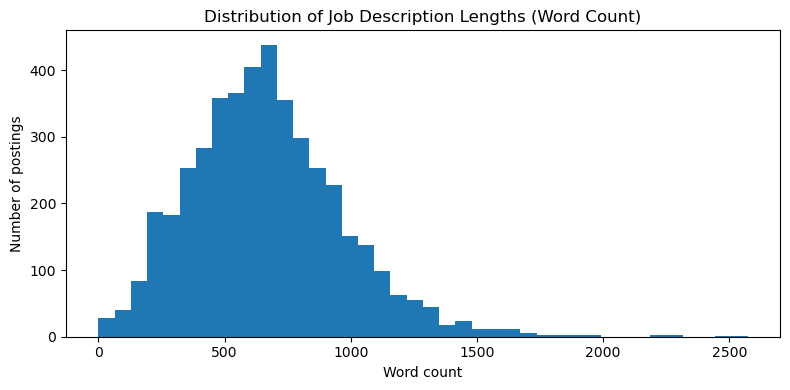

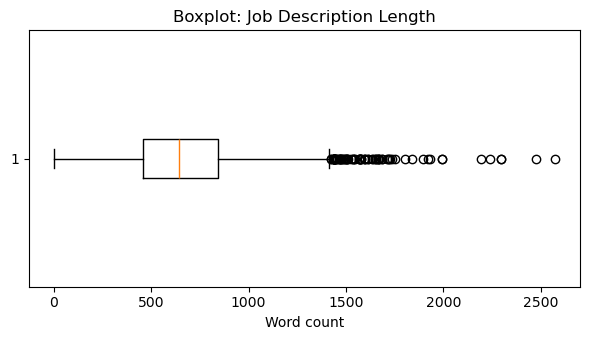


Description length summary:
count    4406.000000
mean      665.924194
std       303.094142
min         0.000000
5%        216.000000
25%       460.250000
50%       645.000000
75%       841.000000
95%      1186.750000
max      2572.000000
Name: word_count, dtype: float64


In [267]:
# ==========================================================
# Text length analysis 
# ==========================================================
def word_count(text):
    if pd.isna(text):
        return 0
    return len(re.findall(r"\b\w+\b", str(text)))

df["word_count"] = df[text_col].apply(word_count)

plt.figure(figsize=(8, 4))
plt.hist(df["word_count"], bins=40)
plt.title("Distribution of Job Description Lengths (Word Count)")
plt.xlabel("Word count")
plt.ylabel("Number of postings")
plt.tight_layout()
plt.show()

plt.figure(figsize=(6, 3.5))
plt.boxplot(df["word_count"], vert=False)
plt.title("Boxplot: Job Description Length")
plt.xlabel("Word count")
plt.tight_layout()
plt.show()

print("\nDescription length summary:")
print(df["word_count"].describe(percentiles=[0.05, 0.25, 0.5, 0.75, 0.95]))


LDA is sensitive to document length. This justifies removing very short postings or possibly trimming extremely long ones 

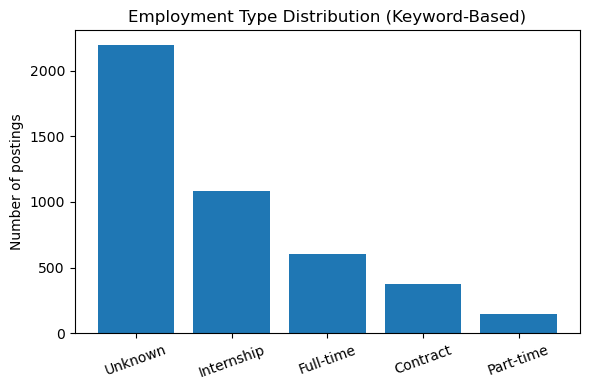


Employment type proportions:
employment_type
Unknown       0.498
Internship    0.246
Full-time     0.138
Contract      0.085
Part-time     0.033
Name: count, dtype: float64


In [268]:
# ==========================================================
# Employment type (rough keyword-based) 
# ==========================================================
import re
import matplotlib.pyplot as plt

def infer_employment_type(text):
    # Safely handle missing values
    if pd.isna(text):
        return "Unknown"
    
    t = str(text).lower()

    if re.search(r"\bintern(ship)?\b", t):
        return "Internship"
    if re.search(r"\bcontract\b|\bfreelance\b|\b1099\b", t):
        return "Contract"
    if re.search(r"\bpart[-\s]?time\b", t):
        return "Part-time"
    if re.search(r"\bfull[-\s]?time\b", t):
        return "Full-time"
    return "Unknown"

df["employment_type"] = df[text_col].apply(infer_employment_type)

etype_counts = df["employment_type"].value_counts()

plt.figure(figsize=(6, 4))
plt.bar(etype_counts.index, etype_counts.values)
plt.title("Employment Type Distribution (Keyword-Based)")
plt.ylabel("Number of postings")
plt.xticks(rotation=20)
plt.tight_layout()
plt.show()

print("\nEmployment type proportions:")
print((etype_counts / len(df)).round(3))


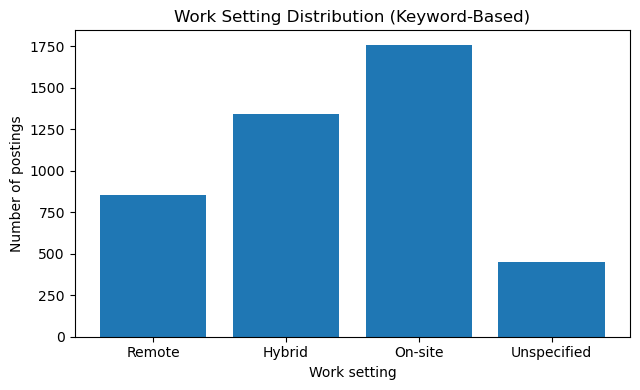

work_setting_rough
On-site        39.9
Hybrid         30.5
Remote         19.4
Unspecified    10.2
Name: proportion, dtype: float64


In [269]:
# -----------------------------
# Work setting graph (remote / hybrid / on-site)
# -----------------------------
import re
import numpy as np
import matplotlib.pyplot as plt

def infer_work_setting(loc, text):
    # handle missing safely
    loc = "" if pd.isna(loc) else str(loc)
    text = "" if pd.isna(text) else str(text)
    s = f"{loc} {text}".lower()

    # order matters: detect hybrid before remote/on-site
    if re.search(r"\bhybrid\b", s):
        return "Hybrid"
    if re.search(r"\bremote\b|\bwork from home\b|\bwfh\b", s):
        return "Remote"
    if re.search(r"\bon[-\s]?site\b|\bonsite\b|\bin[-\s]?person\b|\bon site\b", s):
        return "On-site"
    return "Unspecified"

# Build work_setting_rough using location if available, otherwise text only
if location_col:
    df["work_setting_rough"] = [
        infer_work_setting(loc, txt)
        for loc, txt in zip(df[location_col], df[text_col])
    ]
else:
    df["work_setting_rough"] = [infer_work_setting("", txt) for txt in df[text_col]]

# Plot
ws_order = ["Remote", "Hybrid", "On-site", "Unspecified"]
ws_counts = df["work_setting_rough"].value_counts().reindex(ws_order).fillna(0)

plt.figure(figsize=(6.5, 4))
plt.bar(ws_counts.index, ws_counts.values)
plt.title("Work Setting Distribution (Keyword-Based)")
plt.xlabel("Work setting")
plt.ylabel("Number of postings")
plt.tight_layout()
plt.show()

# Optional quick check
print((df["work_setting_rough"].value_counts(normalize=True) * 100).round(1))


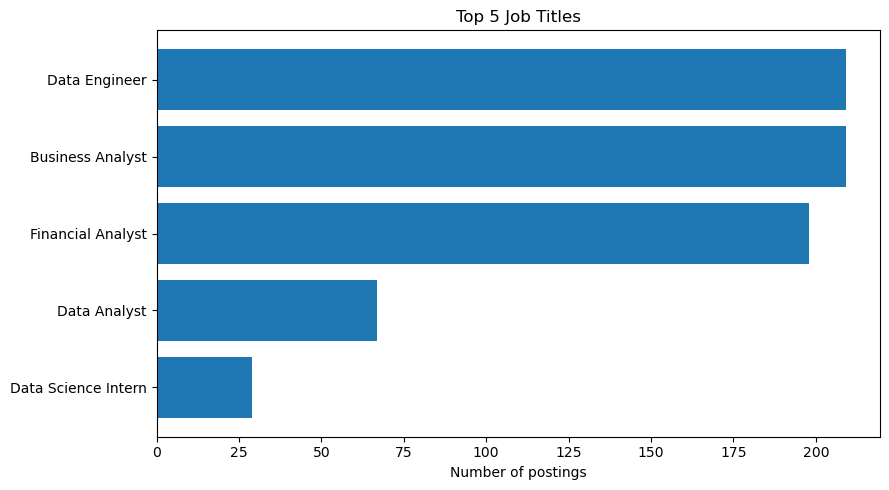

In [270]:
# ==========================================================
# Top job titles
# ==========================================================
if title_col:
    top_titles = df[title_col].value_counts().head(5)

    plt.figure(figsize=(9, 5))
    plt.barh(top_titles.index[::-1], top_titles.values[::-1])
    plt.title("Top 5 Job Titles")
    plt.xlabel("Number of postings")
    plt.tight_layout()
    plt.show()

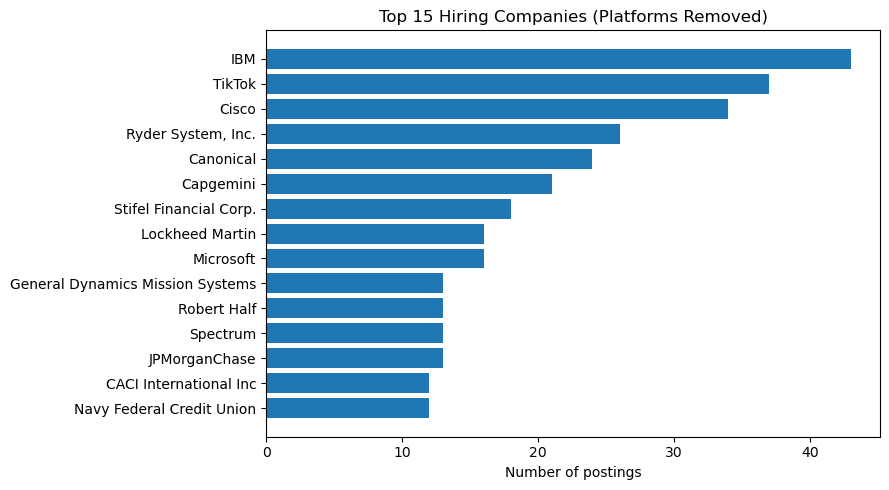

In [271]:
# ==========================================================
# Top hiring companies (exclude job platforms/aggregators)
# ==========================================================

# Regex patterns for platforms (case-insensitive)
platform_pattern = re.compile(
    r"(ripplematch|lensa|jobs\s*via\s*dice|executive\s*placements)",
    re.IGNORECASE
)

def is_platform(company):
    if pd.isna(company):
        return False
    return bool(platform_pattern.search(str(company)))

if company_col:
    # Remove platform / aggregator rows
    company_filtered = df.loc[~df[company_col].apply(is_platform), company_col].dropna()

    top_companies = company_filtered.value_counts().head(15)

    plt.figure(figsize=(9, 5))
    plt.barh(top_companies.index[::-1], top_companies.values[::-1])
    plt.title("Top 15 Hiring Companies (Platforms Removed)")
    plt.xlabel("Number of postings")
    plt.tight_layout()
    plt.show()

    # Transparency ch


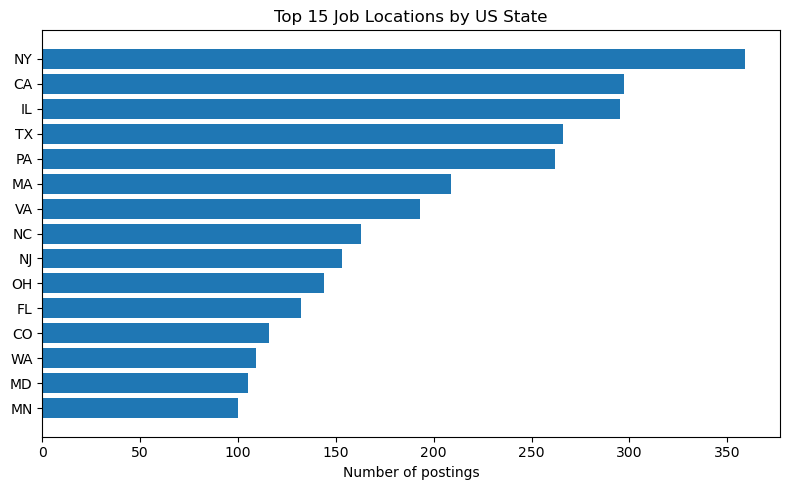


State coverage:
Postings with state identified: 3,769
Total postings: 4,406
% with state info: 85.5%


In [272]:
# ==========================================================
# Top locations (US states only) 
# ==========================================================

if location_col:
    # US state abbreviations
    us_states = [
        "AL","AK","AZ","AR","CA","CO","CT","DE","FL","GA",
        "HI","ID","IL","IN","IA","KS","KY","LA","ME","MD",
        "MA","MI","MN","MS","MO","MT","NE","NV","NH","NJ",
        "NM","NY","NC","ND","OH","OK","OR","PA","RI","SC",
        "SD","TN","TX","UT","VT","VA","WA","WV","WI","WY","DC"
    ]

    state_pattern = r"\b(" + "|".join(us_states) + r")\b"

    def extract_state(loc):
        if pd.isna(loc):
            return np.nan
        loc = str(loc)
        match = re.search(state_pattern, loc)
        return match.group(1) if match else np.nan

    df["state"] = df[location_col].apply(extract_state)

    # Drop rows with no state detected
    state_counts = (
        df["state"]
        .dropna()
        .value_counts()
        .head(15)
    )

    plt.figure(figsize=(8, 5))
    plt.barh(state_counts.index[::-1], state_counts.values[::-1])
    plt.title("Top 15 Job Locations by US State")
    plt.xlabel("Number of postings")
    plt.tight_layout()
    plt.show()

    print("\nState coverage:")
    print(f"Postings with state identified: {df['state'].notna().sum():,}")
    print(f"Total postings: {len(df):,}")
    print(f"% with state info: {df['state'].notna().mean() * 100:.1f}%")


Job locations were aggregated at the U.S. state level using keyword-based extraction from the location field, ignoring work setting (remote/hybrid/on-site) to provide a simple descriptive overview of geographic concentration.

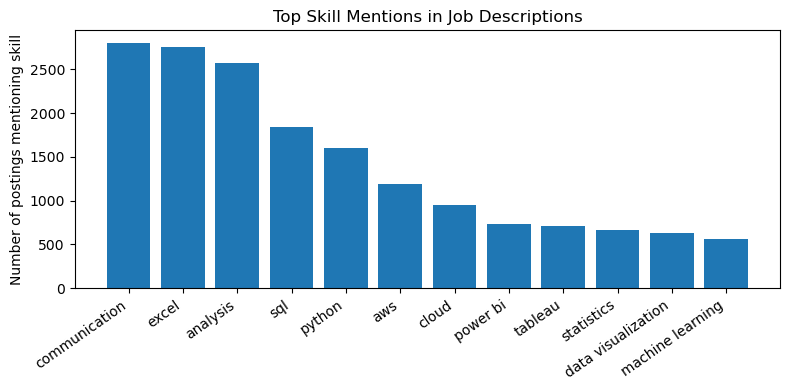

In [273]:
# ==========================================================
# Top skill mentions (light keyword scan)
# ==========================================================
skills = [
    "python", "sql", "excel", "tableau", "power bi",
    "machine learning", "statistics", "aws", "cloud",
    "communication", "analysis", "data visualization"
]

def count_skill(skill):
    return df[text_col].str.contains(skill, case=False, regex=False).sum()

skill_counts = {skill: count_skill(skill) for skill in skills}
skill_df = (
    pd.Series(skill_counts)
      .sort_values(ascending=False)
)

plt.figure(figsize=(8, 4))
plt.bar(skill_df.index, skill_df.values)
plt.title("Top Skill Mentions in Job Descriptions")
plt.ylabel("Number of postings mentioning skill")
plt.xticks(rotation=35, ha="right")
plt.tight_layout()
plt.show()


In [274]:
# ==========================================================
# Are postings too short or boilerplate?
# ==========================================================
short_threshold = 50
short_pct = (df["word_count"] < short_threshold).mean() * 100

print(f"\n% of postings under {short_threshold} words: {short_pct:.1f}%")

# Identify common repeated phrases (boilerplate check)
boilerplate_phrases = [
    "equal opportunity employer",
    "accommodations",
    "we are looking for",
    "diversity and inclusion",
    "fast-paced environment"
]

boilerplate_counts = {
    phrase: df[text_col].str.contains(phrase, case=False).mean() * 100
    for phrase in boilerplate_phrases
}

print("\nBoilerplate phrase prevalence (% of postings):")
for k, v in boilerplate_counts.items():
    print(f"{k}: {v:.1f}%")


% of postings under 50 words: 0.6%

Boilerplate phrase prevalence (% of postings):
equal opportunity employer: 39.9%
accommodations: 17.2%
we are looking for: 9.3%
diversity and inclusion: 2.5%
fast-paced environment: 7.6%


III. PULL OUT STRUCTURED FACTS (employment type, work setting, level)

In [218]:
df.head()

,url,company,title,salary,location,description,word_count,employment_type,work_setting_rough,state
0,https://www.linkedin.com/jobs/view/4349682995?...,Major League Baseball (MLB),Intelligence Analyst,$72.5K/yr - $85K/yr,"New York, NY",The Intelligence Analyst for Major League Base...,890,Unknown,Remote,NY
1,https://www.linkedin.com/jobs/view/4326436968?...,KeyBank,2026 HR Analytics Rotational Analyst – Cleveland,$51K/yr - $78K/yr,"Brooklyn, OH (Remote)","Location:\n4900 Tiedeman Road, Brooklyn Ohio\n...",955,Internship,Hybrid,OH
2,https://www.linkedin.com/jobs/view/4349724945?...,DHL Supply Chain,Business Data Analyst I,$70K/yr - $115K/yr · 401(k) benefit,"Middletown, PA",The Business Data Analyst I role has a nationa...,534,Unknown,On-site,PA
3,https://www.linkedin.com/jobs/view/4326758467?...,Constellation,Associate Origination Analyst - New Grads 2026,$73.8K/yr - $82K/yr · 401(k) benefit,"Baltimore, MD (Hybrid)",Who We Are\nAs the nation's largest producer o...,486,Unknown,Hybrid,MD
4,https://www.linkedin.com/jobs/view/4326854819?...,The Hershey Company,"Analyst, People Insights",NaN,"Hershey, PA (Hybrid)","Location:\nHershey, PA or open to remote\nJob ...",312,Unknown,Hybrid,PA


In [275]:
cols_to_drop = ["word_count", "employment_type", "work_setting_rough", "state"]

df.drop(columns=cols_to_drop, errors="ignore", inplace=True)

df.head()

,url,company,title,salary,location,description
0,https://www.linkedin.com/jobs/view/4349682995?...,Major League Baseball (MLB),Intelligence Analyst,$72.5K/yr - $85K/yr,"New York, NY",The Intelligence Analyst for Major League Base...
1,https://www.linkedin.com/jobs/view/4326436968?...,KeyBank,2026 HR Analytics Rotational Analyst – Cleveland,$51K/yr - $78K/yr,"Brooklyn, OH (Remote)","Location:\n4900 Tiedeman Road, Brooklyn Ohio\n..."
2,https://www.linkedin.com/jobs/view/4349724945?...,DHL Supply Chain,Business Data Analyst I,$70K/yr - $115K/yr · 401(k) benefit,"Middletown, PA",The Business Data Analyst I role has a nationa...
3,https://www.linkedin.com/jobs/view/4326758467?...,Constellation,Associate Origination Analyst - New Grads 2026,$73.8K/yr - $82K/yr · 401(k) benefit,"Baltimore, MD (Hybrid)",Who We Are\nAs the nation's largest producer o...
4,https://www.linkedin.com/jobs/view/4326854819?...,The Hershey Company,"Analyst, People Insights",NaN,"Hershey, PA (Hybrid)","Location:\nHershey, PA or open to remote\nJob ..."


In [ ]:
# Keep raw text + create “light” structured columns
# (work_setting, employment_type, seniority_level, region, industry)

# ---------------------------
# NA-safe text handling
# ---------------------------
def safe_str(s):
    if pd.isna(s):
        return ""
    return str(s)

# ---------------------------
# raw_text = lightly combined field (title + description + company + location)
# ---------------------------
df["raw_text"] = (
    df["title"].map(safe_str).str.strip() + " " +
    df["description"].map(safe_str).str.strip() + " " +
    df["company"].map(safe_str).str.strip() + " " +
    df["location"].map(safe_str).str.strip()
)
# ---------------------------
# STEP 2A: work_setting (remote / hybrid / on-site)
# ---------------------------
REMOTE_PAT = re.compile(r"\b(remote|work from home|wfh|telecommut|home[-\s]?based|fully remote)\b", re.I)
HYBRID_PAT = re.compile(r"\b(hybrid|flexible hybrid|partial remote|mix of remote|split time)\b", re.I)
ONSITE_PAT = re.compile(r"\b(on[-\s]?site|onsite|in[-\s]?office|office[-\s]?based|in person|in-person)\b", re.I)

def infer_work_setting(text, loc_text=""):
    t = f"{text} {loc_text}".lower()

    # prioritize explicit hybrid over remote/onsite if both appear
    if HYBRID_PAT.search(t):
        return "hybrid"
    if REMOTE_PAT.search(t):
        return "remote"
    if ONSITE_PAT.search(t):
        return "on-site"

    # sometimes location strings contain "(Remote)" etc.
    if "remote" in loc_text.lower():
        return "remote"
    return "unknown"

loc_series = df[location_col].map(safe_str) if location_col else pd.Series([""] * len(df), index=df.index)
df["work_setting"] = [infer_work_setting(rt, lt) for rt, lt in zip(df["raw_text"], loc_series)]

# ---------------------------
# STEP 2B: employment_type (full-time / part-time / contract / internship / temporary)
# ---------------------------
EMPLOYMENT_RULES = [
    # Internships & early career
    ("Internship", re.compile(
        r"\b(intern|internship|co[-\s]?op|apprenticeship)\b", re.I)),

    # Contract-based roles
    ("Contract-to-Hire", re.compile(
        r"\b(contract[-\s]?to[-\s]?hire|c2h)\b", re.I)),
    ("Contract", re.compile(
        r"\b(contract|contractor|independent contractor|freelance|consultant|1099)\b", re.I)),

    # Temporary & seasonal
    ("Temporary / Seasonal", re.compile(
        r"\b(temp|temporary|seasonal|short[-\s]?term|fixed[-\s]?term)\b", re.I)),

    # Employment hours
    ("Part-Time", re.compile(
        r"\b(part[-\s]?time)\b", re.I)),
    ("Full-Time", re.compile(
        r"\b(full[-\s]?time)\b", re.I)),
]

def infer_employment_type_specific(text):
    t = safe_str(text)
    for label, pat in EMPLOYMENT_RULES:
        if pat.search(t):
            return label
    return "Unspecified"

df["employment_type"] = df["raw_text"].map(infer_employment_type_specific)

# ---------------------------
# STEP 2C: seniority_level (new_grad / entry / mid / senior / lead / manager / director+)
# ---------------------------
SENIORITY_RULES = [
    ("director_plus", re.compile(r"\b(director|vp|vice president|head of|chief|c[\-]?level|executive)\b", re.I)),
    ("manager",       re.compile(r"\b(manager|people manager)\b", re.I)),
    ("lead",          re.compile(r"\b(lead|principal|staff|architect)\b", re.I)),
    ("senior",        re.compile(r"\b(senior|sr\.?)\b", re.I)),
    ("mid",           re.compile(r"\b(mid[-\s]?level|intermediate|associate(?!\s+degree))\b", re.I)),
    ("entry",         re.compile(r"\b(entry[-\s]?level|entry level|junior|jr\.?)\b", re.I)),
    ("new_grad",      re.compile(r"\b(new grad|new graduate|graduate|campus hire|early career)\b", re.I)),
]

def infer_seniority(text):
    t = text.lower()
    for label, pat in SENIORITY_RULES:
        if pat.search(t):
            return label
    return "unknown"

df["seniority_level"] = df["raw_text"].map(infer_seniority)

# ---------------------------
# STEP 2D: region parsing (city/state/country — best-effort from location string)
# ---------------------------
US_STATE_ABBR = set("""
AL AK AZ AR CA CO CT DE FL GA HI ID IL IN IA KS KY LA ME MD MA MI MN MS MO MT NE NV NH NJ NM NY
NC ND OH OK OR PA RI SC SD TN TX UT VT VA WA WV WI WY DC
""".split())

def parse_location(loc):
    """
    Best-effort parser:
    - Handles formats like: "New York, NY", "San Francisco, CA (Remote)", "London, England, United Kingdom"
    - Returns (city, state, country)
    """
    if not loc or pd.isna(loc):
        return ("unknown", "unknown", "unknown")

    s = str(loc)
    # remove parenthetical tags like "(Remote)"
    s = re.sub(r"\([^)]*\)", "", s).strip()
    s = re.sub(r"\s+", " ", s)

    # LinkedIn often uses "Area" strings; keep it simple:
    parts = [p.strip() for p in s.split(",") if p.strip()]

    city, state, country = "unknown", "unknown", "unknown"

    if len(parts) == 1:
        # could be city or country
        city = parts[0]
    elif len(parts) == 2:
        city = parts[0]
        # second part might be state abbrev or country/region
        p1 = parts[1]
        if p1.upper() in US_STATE_ABBR:
            state = p1.upper()
            country = "United States"
        else:
            country = p1
    else:
        # 3+ parts: assume city, state/region, country (rough)
        city = parts[0]
        mid = parts[1]
        last = parts[-1]
        if mid.upper() in US_STATE_ABBR:
            state = mid.upper()
            country = "United States"
        else:
            state = mid
            country = last

    return (city, state, country)

if location_col:
    parsed = df[location_col].map(safe_str).map(parse_location)
    df["city"] = [x[0] for x in parsed]
    df["state_or_region"] = [x[1] for x in parsed]
    df["country"] = [x[2] for x in parsed]
else:
    df["city"] = "unknown"
    df["state_or_region"] = "unknown"
    df["country"] = "unknown"

# ---------------------------
# STEP 2E: Industry buckets (broad) using keywords in title + description
# ---------------------------
INDUSTRY_BUCKETS = [
    # --- Technology ---
    ("Software / Engineering", re.compile(
        r"\b(software engineer|developer|full[-\s]?stack|frontend|backend|mobile app|platform engineer)\b", re.I)),
    ("Data / AI / Analytics", re.compile(
        r"\b(data scientist|data analyst|machine learning|ml engineer|ai engineer|analytics|business intelligence)\b", re.I)),
    ("IT / Cloud / Security", re.compile(
        r"\b(it support|information technology|cloud|aws|azure|gcp|devops|site reliability|sre|cyber|security)\b", re.I)),

    # --- Finance & Business ---
    ("Finance / Banking", re.compile(
        r"\b(finance|financial analyst|bank|banking|investment|trading|capital markets)\b", re.I)),
    ("Accounting / Audit", re.compile(
        r"\b(accounting|accountant|audit|assurance|tax|controller|cpa)\b", re.I)),
    ("Consulting / Strategy", re.compile(
        r"\b(consultant|consulting|strategy|advisory|management consulting)\b", re.I)),

    # --- Marketing & Sales ---
    ("Marketing / Growth", re.compile(
        r"\b(marketing|growth|brand|digital marketing|seo|content|campaign|email marketing)\b", re.I)),
    ("Sales / Business Development", re.compile(
        r"\b(sales|account executive|business development|bd|customer acquisition|revenue)\b", re.I)),
    ("Customer Success / Support", re.compile(
        r"\b(customer success|customer support|client services|account manager|relationship manager)\b", re.I)),

    # --- Healthcare & Life Sciences ---
    ("Healthcare / Clinical", re.compile(
        r"\b(healthcare|clinical|hospital|patient care|medical assistant|nurse|physician)\b", re.I)),
    ("Pharma / Biotech", re.compile(
        r"\b(pharma|pharmaceutical|biotech|biotechnology|life sciences|clinical research)\b", re.I)),

    # --- Design, Media, Product ---
    ("Product Management", re.compile(
        r"\b(product manager|product management|product owner)\b", re.I)),
    ("UX / UI / Design", re.compile(
        r"\b(ux|ui|product designer|visual designer|interaction designer|graphic designer)\b", re.I)),
    ("Media / Communications", re.compile(
        r"\b(media|communications|public relations|pr|journalism|copywriter|editor)\b", re.I)),

    # --- Operations & HR ---
    ("Operations / Supply Chain", re.compile(
        r"\b(operations|supply chain|logistics|procurement|inventory|fulfillment)\b", re.I)),
    ("Human Resources / Recruiting", re.compile(
        r"\b(hr|human resources|people operations|recruiter|talent acquisition)\b", re.I)),

    # --- Education & Public ---
    ("Education / Research", re.compile(
        r"\b(education|teacher|professor|lecturer|research assistant|researcher|academic)\b", re.I)),
    ("Government / Nonprofit", re.compile(
        r"\b(government|public sector|policy|nonprofit|ngo|foundation)\b", re.I)),
]

def infer_industry_specific(text):
    t = safe_str(text)
    for label, pat in INDUSTRY_BUCKETS:
        if pat.search(t):
            return label
    return "Other / Mixed"

df["industry"] = df["raw_text"].map(infer_industry_specific)

# ---------------------------
# Check
# ---------------------------
df.head()


,url,company,title,salary,location,description,raw_text,work_setting,employment_type,seniority_level,city,state_or_region,country,industry
0,https://www.linkedin.com/jobs/view/4349682995?...,Major League Baseball (MLB),Intelligence Analyst,$72.5K/yr - $85K/yr,"New York, NY",The Intelligence Analyst for Major League Base...,Intelligence Analyst The Intelligence Analyst ...,remote,Temporary / Seasonal,director_plus,New York,NY,United States,IT / Cloud / Security
1,https://www.linkedin.com/jobs/view/4326436968?...,KeyBank,2026 HR Analytics Rotational Analyst – Cleveland,$51K/yr - $78K/yr,"Brooklyn, OH (Remote)","Location:\n4900 Tiedeman Road, Brooklyn Ohio\n...",2026 HR Analytics Rotational Analyst – Clevela...,hybrid,Internship,director_plus,Brooklyn,OH,United States,Data / AI / Analytics
2,https://www.linkedin.com/jobs/view/4349724945?...,DHL Supply Chain,Business Data Analyst I,$70K/yr - $115K/yr · 401(k) benefit,"Middletown, PA",The Business Data Analyst I role has a nationa...,Business Data Analyst I The Business Data Anal...,on-site,Unspecified,mid,Middletown,PA,United States,Data / AI / Analytics
3,https://www.linkedin.com/jobs/view/4326758467?...,Constellation,Associate Origination Analyst - New Grads 2026,$73.8K/yr - $82K/yr · 401(k) benefit,"Baltimore, MD (Hybrid)",Who We Are\nAs the nation's largest producer o...,Associate Origination Analyst - New Grads 2026...,hybrid,Unspecified,lead,Baltimore,MD,United States,Data / AI / Analytics
4,https://www.linkedin.com/jobs/view/4326854819?...,The Hershey Company,"Analyst, People Insights",NaN,"Hershey, PA (Hybrid)","Location:\nHershey, PA or open to remote\nJob ...","Analyst, People Insights Location:\nHershey, P...",hybrid,Unspecified,unknown,Hershey,PA,United States,Data / AI / Analytics


IV. TEXT PREPROCESSING

In [277]:
# Clean text for topic modeling (create: df["text_for_NLP"])
# Uses columns: description/raw_text + keeps everything else unchanged.

from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS

SOURCE_COL = "raw_text" if "raw_text" in df.columns else "description"
if SOURCE_COL not in df.columns:
    raise KeyError("Expected a text column named 'raw_text' or 'description'.")

# Regex patterns
URL_RE = re.compile(r"(https?://\S+|www\.\S+)")
EMAIL_RE = re.compile(r"\b[\w\.-]+@[\w\.-]+\.\w+\b")
NON_LETTER_RE = re.compile(r"[^a-z\s]")
MULTISPACE_RE = re.compile(r"\s+")

BOILERPLATE_PATTERNS = [
    r"equal opportunity employer",
    r"we are looking for",
    r"we're looking for",
    r"reasonable accommodations?",
    r"accommodations?",
    r"all qualified applicants?",
    r"without regard to (race|color|religion|sex|gender|sexual orientation|national origin|age|disability|veteran status)",
    r"drug[- ]free workplace",
    r"background check",
    r"work authorization",
    r"e-?verify",
    r"privacy policy",
]


# Extra stopwords common in job posts 
EXTRA_STOPWORDS = {
    "responsibilities", "requirements", "qualifications", "preferred",
    "job", "role", "position", "candidate", "candidates",
    "company", "companies", "team", "teams",
    "experience", "year", "years",
    "benefits", "inclusive", "diversity", "equity", "inclusion",
    "apply", "applicants", "application", "able", "must", "should",
    "required", "preferred",
    "capable", "demonstrate", "demonstrated",
    "responsible", "responsibilities",
    "ensure", "including",     "ability", "abilities",
    "skills", "skill",
    "strong", "excellent", "demonstrated",
    "capable", "motivated",
    "required", "preferred",
    "proficiency", "effectively", "aap"
}

STOPWORDS = set(ENGLISH_STOP_WORDS).union(EXTRA_STOPWORDS)


def clean_text_for_nlp(text):
    if pd.isna(text):
        return ""

    text = str(text).lower()
    text = URL_RE.sub(" ", text)
    text = EMAIL_RE.sub(" ", text)

    for pat in BOILERPLATE_PATTERNS:
        text = re.sub(pat, " ", text)

    text = NON_LETTER_RE.sub(" ", text)
    text = MULTISPACE_RE.sub(" ", text).strip()

    tokens = [
        t for t in text.split()
        if len(t) >= 3 and t not in STOPWORDS
    ]

    return " ".join(tokens)

# Create the cleaned column
df["text_for_NLP"] = df[SOURCE_COL].apply(clean_text_for_nlp)

df.head()


,url,company,title,salary,location,description,raw_text,work_setting,employment_type,seniority_level,city,state_or_region,country,industry,text_for_NLP
0,https://www.linkedin.com/jobs/view/4349682995?...,Major League Baseball (MLB),Intelligence Analyst,$72.5K/yr - $85K/yr,"New York, NY",The Intelligence Analyst for Major League Base...,Intelligence Analyst The Intelligence Analyst ...,remote,Temporary / Seasonal,director_plus,New York,NY,United States,IT / Cloud / Security,intelligence analyst intelligence analyst majo...
1,https://www.linkedin.com/jobs/view/4326436968?...,KeyBank,2026 HR Analytics Rotational Analyst – Cleveland,$51K/yr - $78K/yr,"Brooklyn, OH (Remote)","Location:\n4900 Tiedeman Road, Brooklyn Ohio\n...",2026 HR Analytics Rotational Analyst – Clevela...,hybrid,Internship,director_plus,Brooklyn,OH,United States,Data / AI / Analytics,analytics rotational analyst cleveland locatio...
2,https://www.linkedin.com/jobs/view/4349724945?...,DHL Supply Chain,Business Data Analyst I,$70K/yr - $115K/yr · 401(k) benefit,"Middletown, PA",The Business Data Analyst I role has a nationa...,Business Data Analyst I The Business Data Anal...,on-site,Unspecified,mid,Middletown,PA,United States,Data / AI / Analytics,business data analyst business data analyst na...
3,https://www.linkedin.com/jobs/view/4326758467?...,Constellation,Associate Origination Analyst - New Grads 2026,$73.8K/yr - $82K/yr · 401(k) benefit,"Baltimore, MD (Hybrid)",Who We Are\nAs the nation's largest producer o...,Associate Origination Analyst - New Grads 2026...,hybrid,Unspecified,lead,Baltimore,MD,United States,Data / AI / Analytics,associate origination analyst new grads nation...
4,https://www.linkedin.com/jobs/view/4326854819?...,The Hershey Company,"Analyst, People Insights",NaN,"Hershey, PA (Hybrid)","Location:\nHershey, PA or open to remote\nJob ...","Analyst, People Insights Location:\nHershey, P...",hybrid,Unspecified,unknown,Hershey,PA,United States,Data / AI / Analytics,analyst people insights location hershey open ...


In [279]:
df[[SOURCE_COL, "text_for_NLP"]].head()

,raw_text,text_for_NLP
0,Intelligence Analyst The Intelligence Analyst ...,intelligence analyst intelligence analyst majo...
1,2026 HR Analytics Rotational Analyst – Clevela...,analytics rotational analyst cleveland locatio...
2,Business Data Analyst I The Business Data Anal...,business data analyst business data analyst na...
3,Associate Origination Analyst - New Grads 2026...,associate origination analyst new grads nation...
4,"Analyst, People Insights Location:\nHershey, P...",analyst people insights location hershey open ...


V. PREPARE FOR LDA

We converted the text_for_NLP column into a document–term matrix using unigram and bigram counts. Terms that appeared in very few postings or in the majority of postings were removed to reduce noise and overly generic language. This matrix serves as the numerical input for the LDA topic model.

In [280]:
# Build the Document–Term Matrix (DTM) for LDA
# Uses df["text_for_NLP"] created above
# Output:
#   - vectorizer (CountVectorizer)
#   - dtm (sparse matrix): rows=posts, cols=terms
#   - vocab (list of feature names)

import numpy as np
from sklearn.feature_extraction.text import CountVectorizer

# ---- Safety checks ----
if "text_for_NLP" not in df.columns:
    raise KeyError("Missing df['text_for_NLP']. Run Step 3 first.")

# Remove empty docs (LDA can't learn from blanks)
docs = df["text_for_NLP"].fillna("").astype(str)
mask_nonempty = docs.str.len() > 0
df_lda = df.loc[mask_nonempty].copy()
docs = docs.loc[mask_nonempty]

# ---- Configure unigram + bigram counts + frequency filtering ----
# min_df: drop terms appearing in < min_df docs (noise)
# max_df: drop terms appearing in > max_df fraction of docs (too generic)
# You can tune these later based on dataset size.

vectorizer = CountVectorizer(
    ngram_range=(1, 2),     # unigrams + bigrams
    min_df=15,               # terms must appear in at least 5 postings
    max_df=0.40,            # terms appearing in >60% of postings are removed
    max_features=30000,
    token_pattern=r"(?u)\b[a-zA-Z]{3,}\b"  # tokens length >= 3 (safe w/ your cleaning)
)

dtm = vectorizer.fit_transform(docs)
vocab = vectorizer.get_feature_names_out()

print("DTM shape (docs x terms):", dtm.shape)
print("Sample vocab terms:", vocab[:25])

# ---- Quick diagnostics (help pick min_df/max_df) ----
# Document frequency per term = how many docs contain the term
doc_freq = np.asarray((dtm > 0).sum(axis=0)).ravel()
print("Median doc frequency:", int(np.median(doc_freq)))
print("Max doc frequency:", int(doc_freq.max()))
print("Min doc frequency:", int(doc_freq.min()))

# If want df_lda + dtm aligned for later steps:
# df_lda corresponds to dtm rows (same order)
# docs corresponds to dtm rows (same order)


DTM shape (docs x terms): (4406, 18404)
Sample vocab terms: ['abide' 'abreast' 'absence' 'absence compensation' 'abstract' 'abundant'
 'abuse' 'academic' 'academic achievement' 'academic background'
 'academic performance' 'academic record' 'academic records'
 'academic standing' 'academic track' 'academics' 'academy' 'accelerate'
 'accelerate career' 'accelerate development' 'accelerate dual'
 'accelerate growth' 'accelerate transformation' 'accelerated'
 'accelerates']
Median doc frequency: 29
Max doc frequency: 1761
Min doc frequency: 15


In [282]:
# check if dtm is good
# most frequent terms

term_freq = np.asarray(dtm.sum(axis=0)).ravel()
top_terms = vocab[np.argsort(term_freq)[::-1][:25]]

top_terms


array(['software', 'analytics', 'health', 'reporting', 'pay', 'services',
       'project', 'quality', 'finance', 'insurance', 'people', 'employee',
       'insights', 'operations', 'research', 'engineer', 'office',
       'product', 'internal', 'career', 'make', 'learning', 'maintain',
       'industry', 'reports'], dtype=object)

In [284]:
# terms with mid-level frequency

mid_terms = vocab[
    (term_freq > np.percentile(term_freq, 50)) &
    (term_freq < np.percentile(term_freq, 80))
][:25]

mid_terms


array(['abreast', 'absence', 'academics', 'academy', 'accelerated',
       'accelerating', 'acceptable', 'acceptance criteria',
       'accepted notice', 'accepted ongoing', 'accepting',
       'access compensation', 'access health', 'access information',
       'accessing', 'accident critical', 'accident insurance',
       'accidental', 'accidental death', 'accommodate',
       'accordance federal', 'accordingly', 'account health',
       'account hsa', 'account management'], dtype=object)

VI. TRAIN LDA & CHOOSE NUMBERS OF TOPIC (K)

We trained Latent Dirichlet Allocation models with varying numbers of topics (K = 5, 8, 10, 12, 15). Model selection was guided by topic coherence scores and qualitative interpretability of topic keywords. We selected the model that balanced high coherence with clearly interpretable and distinct topic themes.

In [285]:
!pip install wordcloud

In [227]:
from wordcloud import WordCloud
import nltk
nltk.download("punkt")
from nltk.stem import PorterStemmer

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\vul\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [286]:
!pip install gensim

In [288]:
# Imports
from sklearn.decomposition import LatentDirichletAllocation
from gensim.models.coherencemodel import CoherenceModel
from gensim.corpora import Dictionary

In [289]:
# Prepare objects needed for coherence
# Coherence needs tokens, not raw strings

# Tokenized documents (from cleaned text)
tokenized_docs = df_lda["text_for_NLP"].str.split()

# Gensim dictionary
dictionary = Dictionary(tokenized_docs)

# Filter extremes (match your vectorizer logic loosely)
dictionary.filter_extremes(no_below=15, no_above=0.4)

# Corpus for gensim
corpus = [dictionary.doc2bow(text) for text in tokenized_docs]

In [290]:
# Function to train LDA + extract top words

def get_top_words(model, feature_names, n_top_words=12):
    topics = []
    for topic_idx, topic in enumerate(model.components_):
        top_features = [
            feature_names[i]
            for i in topic.argsort()[:-n_top_words - 1:-1]
        ]
        topics.append(top_features)
    return topics


In [291]:
# Try multiple K values + compute coherence

K_VALUES = [5, 8, 10, 12, 15]

feature_names = vocab  # from Step 4
coherence_scores = {}
topic_keywords_by_k = {}

for K in K_VALUES:
    lda = LatentDirichletAllocation(
        n_components=K,
        random_state=42,
        learning_method="batch",
        max_iter=20,
        n_jobs=-1
    )

    lda.fit(dtm)

    topics = get_top_words(lda, feature_names, n_top_words=12)
    topic_keywords_by_k[K] = topics

    # Compute coherence (c_v is most interpretable)
    coherence_model = CoherenceModel(
        topics=topics,
        texts=tokenized_docs,
        dictionary=dictionary,
        coherence="c_v"
    )
    coherence_scores[K] = coherence_model.get_coherence()

    print(f"\nK = {K} | Coherence = {coherence_scores[K]:.4f}")
    for i, words in enumerate(topics):
        print(f"  Topic {i+1}: {', '.join(words)}")



K = 5 | Coherence = 0.4941
  Topic 1: software, engineer, test, learning, security, technologies, applications, testing, research, code, python, engineers
  Topic 2: project, health, insurance, services, employee, office, finance, reports, reporting, research, operations, internal
  Topic 3: analytics, insights, power, quality, reporting, engineer, python, pipelines, stakeholders, maintain, models, data engineer
  Topic 4: finance, cisco, financial analyst, sales, accounting, forecasting, incentive, monthly, planning, annual, pay, non
  Topic 5: internship, intern, people, summer, pay, global, make, committed, applicable, future, impact, career

K = 8 | Coherence = 0.5354
  Topic 1: ryder, penn, research, pay, interview, include, adobe, plan, state, internal, remote, term
  Topic 2: insurance, health, employee, medical, plan, leave, pay, dental, vision, assistance, eligible, services
  Topic 3: analytics, power, insights, python, pipelines, engineer, quality, data engineer, models, re

We evaluated LDA models with K = 5, 8, 10, 12, and 15 topics. While coherence scores increased with larger K, we selected K = 12 as the final model because it produced the most interpretable and distinct topic themes, separating analytics, software engineering, finance, healthcare, and early-career roles without excessive fragmentation.

In [292]:
# =========================
# FINAL MODEL 
# =========================

BEST_K = 12

# Fit final LDA model
lda_best = LatentDirichletAllocation(
    n_components=BEST_K,
    learning_method="batch",
    random_state=42,
    max_iter=50,
    n_jobs=-1
)
lda_best.fit(dtm)

# Vocabulary / terms (must match dtm)
terms_best = np.array(vocab)  # or: vectorizer.get_feature_names_out()

# Document-topic proportions (theta)
theta_best = lda_best.transform(dtm)   # shape: (n_docs, BEST_K)

# Topic-term probabilities (beta)
beta_best = lda_best.components_ / lda_best.components_.sum(axis=1, keepdims=True)  # shape: (BEST_K, n_terms)

print("Locked BEST_K =", BEST_K)
print("theta_best shape:", theta_best.shape)
print("beta_best shape:", beta_best.shape)


Locked BEST_K = 12
theta_best shape: (4406, 12)
beta_best shape: (12, 18404)


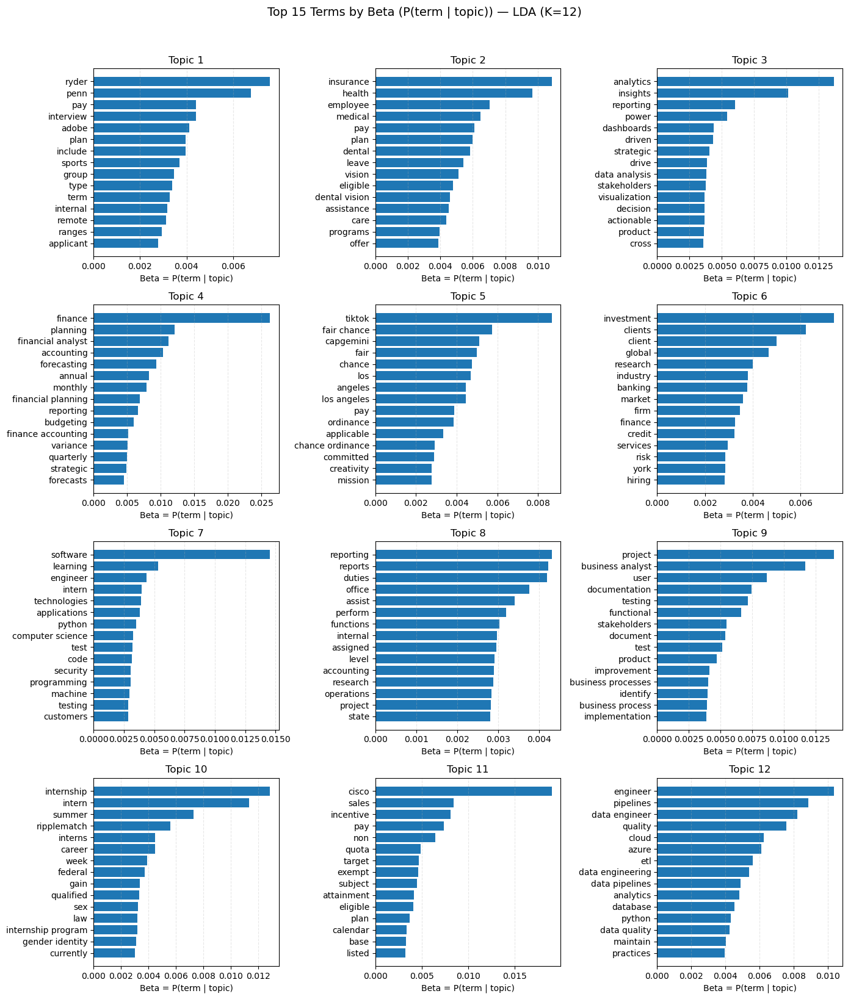

In [299]:
# Visualize topics and terms

K = BEST_K
TOP_N = 15

ncols = 3
nrows = int(np.ceil(K / ncols))

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(14, 4 * nrows))
axes = np.array(axes).reshape(-1)

for k in range(K):
    ax = axes[k]

    # Subset + sort so biggest beta is at top
    d = (
        beta_df[beta_df["topic"] == f"Topic {k + 1}"]
        .sort_values("beta", ascending=True)
    )

    ax.barh(d["term"], d["beta"])
    ax.set_title(f"Topic {k + 1}")
    ax.set_xlabel("Beta = P(term | topic)")
    ax.set_ylabel("")
    ax.grid(axis="x", linestyle="--", alpha=0.3)

# Hide empty panels
for j in range(K, len(axes)):
    axes[j].axis("off")

plt.suptitle(
    f"Top {TOP_N} Terms by Beta (P(term | topic)) — LDA (K={BEST_K})",
    fontsize=14,
    y=1.02
)
plt.tight_layout()
plt.show()


VII. INTERPRET TOPICS

To interpret the topics, we examined the top terms with the highest topic–term probabilities (β) and identified representative job postings with the highest document–topic probabilities (θ). Each topic was assigned a human-readable label based on its dominant keywords and example postings

In [ ]:
# BEST_K = 12
# lda = LatentDirichletAllocation(
#     n_components=BEST_K,
#     learning_method="batch",
#     random_state=42,
#     max_iter=50
# )
# lda.fit(dtm)

# theta = lda.transform(dtm)
# topic_prevalence = theta.mean(axis=0)
# print("K =", lda.n_components)


# BEST_K = 12

# # Fit final LDA model
# lda_best = LatentDirichletAllocation(
#     n_components=BEST_K,
#     learning_method="batch",
#     random_state=42,
#     max_iter=50,
#     n_jobs=-1
# )
# lda_best.fit(dtm)

# # Vocabulary / terms (must match dtm)
# terms_best = np.array(vocab)  # or: vectorizer.get_feature_names_out()

# # Document-topic proportions (theta)
# theta_best = lda_best.transform(dtm)   # shape: (n_docs, BEST_K)

# # Topic-term probabilities (beta)
# beta_best = lda_best.components_ / lda_best.components_.sum(axis=1, keepdims=True)  # shape: (BEST_K, n_terms)

# print("Locked BEST_K =", BEST_K)
# print("theta_best shape:", theta_best.shape)
# print("beta_best shape:", beta_best.shape)



K = 12


In [300]:
# Compute document–topic proportions (θ)
# This tells us which job postings strongly belong to which topic.

# Document-topic matrix: theta (docs × topics)
theta_best = lda_best.transform(dtm) 
print("Theta shape (docs x topics):", theta_best.shape)

Theta shape (docs x topics): (4406, 12)


In [301]:
# Define topic names
topic_labels = {
    0: "Corporate / Hiring Process / Admin",
    1: "Healthcare / Insurance Benefits",
    2: "Data Analytics & BI",
    3: "Finance & Financial Planning & Accounting",
    4: "Compliance / Fair Chance / Legal",
    5: "Investment / Banking",
    6: "Software Engineering",
    7: "Office Operations",
    8: "Business Analyst / Product / Product Ops",
    9: "Internships & Early Career Programs",
    10: "Sales & Incentive Compensation",
    11: "Data Engineering & Cloud"
}


In [302]:
# Top keywords per topic 

TOP_N_WORDS = 15

topic_keywords = {}

for topic_idx in range(BEST_K):
    top_word_ids = np.argsort(beta_best[topic_idx])[::-1][:TOP_N_WORDS]
    topic_keywords[topic_idx] = [terms_best[i] for i in top_word_ids]

# Print keywords nicely
for k in range(BEST_K):
    print(f"\nTopic {k + 1}: {topic_labels[k]}")
    print(", ".join(topic_keywords[k]))


Topic 1: Corporate / Hiring Process / Admin
ryder, penn, pay, interview, adobe, plan, include, sports, type, group, internal, term, remote, ranges, applicant

Topic 2: Healthcare / Insurance Benefits
insurance, health, employee, medical, pay, plan, dental, leave, vision, eligible, dental vision, care, assistance, offer, programs

Topic 3: Data Analytics & BI
analytics, insights, reporting, power, driven, dashboards, strategic, drive, stakeholders, data analysis, product, decision, cross, actionable, visualization

Topic 4: Finance & Financial Planning & Accounting
finance, accounting, financial analyst, planning, forecasting, monthly, annual, reporting, financial planning, budgeting, finance accounting, quarterly, strategic, forecasts, variance

Topic 5: Compliance / Fair Chance / Legal
tiktok, fair chance, capgemini, fair, chance, los, angeles, los angeles, ordinance, pay, applicable, chance ordinance, committed, creativity, mission

Topic 6: Investment / Banking
investment, clients,

In [303]:
# Pull 2–3 representative job postings per topic
# We select postings with highest θ (topic probability)

EXAMPLES_PER_TOPIC = 3

example_posts = {}

for topic_idx in range(BEST_K):
    top_doc_indices = np.argsort(theta_best[:, topic_idx])[::-1][:EXAMPLES_PER_TOPIC]

    example_posts[topic_idx] = df_lda.iloc[top_doc_indices][
        ["title", "company", "location", "industry"]
    ]


In [304]:
# Display interpretation for each topic

for k in range(BEST_K):
    print("=" * 80)
    print(f"Topic {k + 1}: {topic_labels[k]}")
    print("- Top keywords:")
    print(", ".join(topic_keywords[k]))

    print("\n- Example job postings:")
    display(example_posts[k])


Topic 1: Corporate / Hiring Process / Admin
- Top keywords:
ryder, penn, pay, interview, adobe, plan, include, sports, type, group, internal, term, remote, ranges, applicant

- Example job postings:


,title,company,location,industry
3982,Financial Analyst - REMOTE,"Ryder System, Inc.","Des Moines, IA (Remote)",IT / Cloud / Security
4277,Financial Analyst - REMOTE,"Ryder System, Inc.","Alpharetta, GA (Remote)",IT / Cloud / Security
4224,Financial Analyst - REMOTE,"Ryder System, Inc.","Atlanta, GA (Remote)",IT / Cloud / Security


Topic 2: Healthcare / Insurance Benefits
- Top keywords:
insurance, health, employee, medical, pay, plan, dental, leave, vision, eligible, dental vision, care, assistance, offer, programs

- Example job postings:


,title,company,location,industry
1190,Business Analyst,Oracle,United States (Remote),IT / Cloud / Security
1270,"Business Analyst, Assoc",Apex Systems,"Juno Beach, FL (On-site)",Other / Mixed
869,Financial Intelligence Analyst,Apex Systems,"Merrifield, VA (Remote)",Finance / Banking


Topic 3: Data Analytics & BI
- Top keywords:
analytics, insights, reporting, power, driven, dashboards, strategic, drive, stakeholders, data analysis, product, decision, cross, actionable, visualization

- Example job postings:


,title,company,location,industry
879,Data Analyst,AARATECH,Washington DC-Baltimore Area (On-site),Data / AI / Analytics
776,Data Analyst,AARATECH,"Chicago, IL (On-site)",Data / AI / Analytics
725,Data Analyst,AARATECH,"Chicago, IL (On-site)",Data / AI / Analytics


Topic 4: Finance & Financial Planning & Accounting
- Top keywords:
finance, accounting, financial analyst, planning, forecasting, monthly, annual, reporting, financial planning, budgeting, finance accounting, quarterly, strategic, forecasts, variance

- Example job postings:


,title,company,location,industry
4108,Financial Analyst,Canonical,"New York, NY (Remote)",Data / AI / Analytics
4259,Financial Analyst,Canonical,"Kansas City, KS (Remote)",Data / AI / Analytics
3942,Financial Analyst,Canonical,"Columbus, OH (Remote)",Data / AI / Analytics


Topic 5: Compliance / Fair Chance / Legal
- Top keywords:
tiktok, fair chance, capgemini, fair, chance, los, angeles, los angeles, ordinance, pay, applicable, chance ordinance, committed, creativity, mission

- Example job postings:


,title,company,location,industry
2032,Junior Data Engineer,Capgemini,"Atlanta, GA",IT / Cloud / Security
2008,Junior Data Engineer,Capgemini,"Atlanta, GA",IT / Cloud / Security
2081,Junior Data Engineer,Capgemini,"Atlanta, GA",IT / Cloud / Security


Topic 6: Investment / Banking
- Top keywords:
investment, clients, client, global, research, industry, banking, market, firm, finance, credit, services, risk, york, real

- Example job postings:


,title,company,location,industry
3612,2027 KBW Investment Banking Summer Analyst - N...,Stifel Financial Corp.,"New York, NY (On-site)",Finance / Banking
3544,2027 KBW Investment Banking Summer Analyst - C...,Stifel Financial Corp.,"Chicago, IL (On-site)",Finance / Banking
3936,2027 KBW Investment Banking Summer Analyst - S...,Stifel Financial Corp.,"San Francisco, CA (On-site)",Finance / Banking


Topic 7: Software Engineering
- Top keywords:
software, learning, engineer, technologies, applications, python, intern, code, test, computer science, security, programming, machine, customers, testing

- Example job postings:


,title,company,location,industry
2708,Software Developer Intern 2026 - Poughkeepsie NY,IBM,"Poughkeepsie, NY (Hybrid)",Software / Engineering
2577,Entry Level Software Developer - Poughkeepsie NY,IBM,"Poughkeepsie, NY (Hybrid)",Software / Engineering
3091,NVIDIA 2026 Internships: Software Engineering ...,NVIDIA,"Santa Clara, CA",Data / AI / Analytics


Topic 8: Office Operations
- Top keywords:
reports, duties, reporting, office, assist, perform, functions, research, assigned, internal, level, operations, state, project, compliance

- Example job postings:


,title,company,location,industry
677,Data Input Analyst I,Citizens Business Bank,"Rancho Cucamonga, CA (On-site)",Finance / Banking
4162,Corporate Financial Analyst - FT - Days - MHS,Memorial Healthcare System,"Hollywood, FL (On-site)",Finance / Banking
3650,Financial Analyst (5 positions),Ohio Department of Public Safety,"Columbus, OH",Finance / Banking


Topic 9: Business Analyst / Product / Product Ops
- Top keywords:
project, business analyst, user, documentation, testing, functional, stakeholders, document, test, product, improvement, business processes, identify, implementation, business process

- Example job postings:


,title,company,location,industry
1341,Business Analyst,Robert Half,"Carmel, IN (Remote)",Finance / Banking
1628,Business Analyst,Jobs via Dice,"Egg Harbor, NJ (On-site)",IT / Cloud / Security
1461,Business Analyst I (Contractor),Jobs via Dice,"Philadelphia, PA (On-site)",Data / AI / Analytics


Topic 10: Internships & Early Career Programs
- Top keywords:
internship, intern, summer, ripplematch, interns, career, week, federal, sex, qualified, gender identity, law, currently, gain, internship program

- Example job postings:


,title,company,location,industry
1560,"Business Analyst, application via RippleMatch",RippleMatch,"Minneapolis, MN",Data / AI / Analytics
1226,"Business Analyst Intern, application via Rippl...",RippleMatch,"Pittsburgh, PA",Data / AI / Analytics
1274,"Business Analyst Intern, application via Rippl...",RippleMatch,"Nashville, TN",Data / AI / Analytics


Topic 11: Sales & Incentive Compensation
- Top keywords:
cisco, sales, incentive, pay, non, quota, exempt, target, subject, attainment, eligible, plan, calendar, base, listed

- Example job postings:


,title,company,location,industry
2937,Software Engineer Data/AI/Intelligent Systems ...,Cisco,"Boston, MA (On-site)",Software / Engineering
2379,Software Engineer Data/AI/Intelligent Systems ...,Cisco,"Austin, TX (On-site)",Software / Engineering
2861,Software Engineer Data/AI/Intelligent Systems ...,Cisco,"Boston, MA (On-site)",Software / Engineering


Topic 12: Data Engineering & Cloud
- Top keywords:
engineer, pipelines, data engineer, quality, cloud, azure, etl, data engineering, analytics, data pipelines, database, python, data quality, maintain, practices

- Example job postings:


,title,company,location,industry
2112,Data Engineer,Synchrony,New York City Metropolitan Area (Hybrid),IT / Cloud / Security
2009,Data Engineer,Synchrony,"Alpharetta, GA",IT / Cloud / Security
2036,Data Engineer,Synchrony,"Alpharetta, GA",IT / Cloud / Security


In [305]:
# Create a clean summary table

summary_rows = []

for k in range(BEST_K):
    summary_rows.append({
        "Topic": f"Topic {k + 1}",
        "Label": topic_labels[k],
        "Top Keywords": ", ".join(topic_keywords[k])
    })

topic_summary = pd.DataFrame(summary_rows)
topic_summary


,Topic,Label,Top Keywords
0,Topic 1,Corporate / Hiring Process / Admin,"ryder, penn, pay, interview, adobe, plan, incl..."
1,Topic 2,Healthcare / Insurance Benefits,"insurance, health, employee, medical, pay, pla..."
2,Topic 3,Data Analytics & BI,"analytics, insights, reporting, power, driven,..."
3,Topic 4,Finance & Financial Planning & Accounting,"finance, accounting, financial analyst, planni..."
4,Topic 5,Compliance / Fair Chance / Legal,"tiktok, fair chance, capgemini, fair, chance, ..."
5,Topic 6,Investment / Banking,"investment, clients, client, global, research,..."
6,Topic 7,Software Engineering,"software, learning, engineer, technologies, ap..."
7,Topic 8,Office Operations,"reports, duties, reporting, office, assist, pe..."
8,Topic 9,Business Analyst / Product / Product Ops,"project, business analyst, user, documentation..."
9,Topic 10,Internships & Early Career Programs,"internship, intern, summer, ripplematch, inter..."


STEP 7: VISUALIZATIONS

In [306]:
!pip install wordcloud pyLDAvis

c:\Dickinson\Lib\site-packages\matplotlib\cbook.py:684: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.


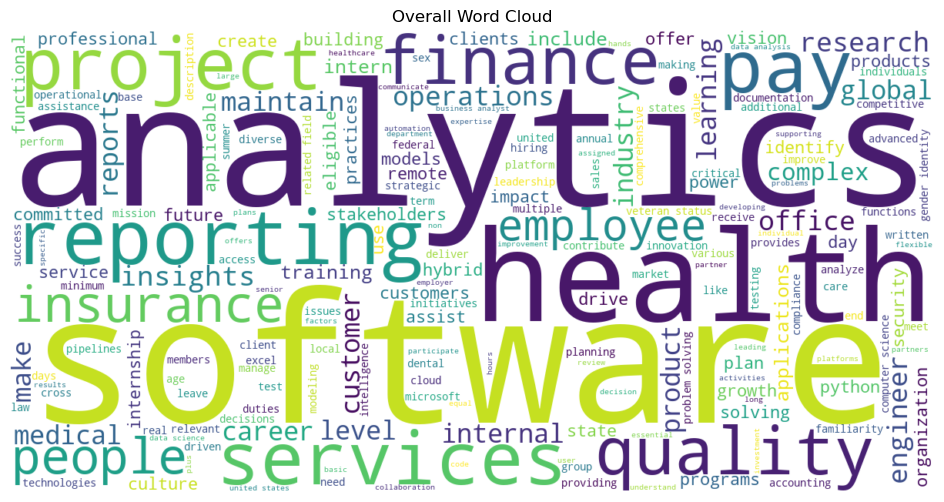

In [310]:

from wordcloud import WordCloud

# Overall word cloud

terms = terms_best
term_freq = np.asarray(dtm.sum(axis=0)).ravel()
freqs = dict(zip(terms, term_freq))

wc = WordCloud(width=1200, height=600, background_color="white").generate_from_frequencies(freqs)
plt.figure(figsize=(12, 6))
plt.imshow(wc, interpolation="bilinear")
plt.axis("off")
plt.title("Overall Word Cloud")
plt.show()

c:\Dickinson\Lib\site-packages\matplotlib\cbook.py:684: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.


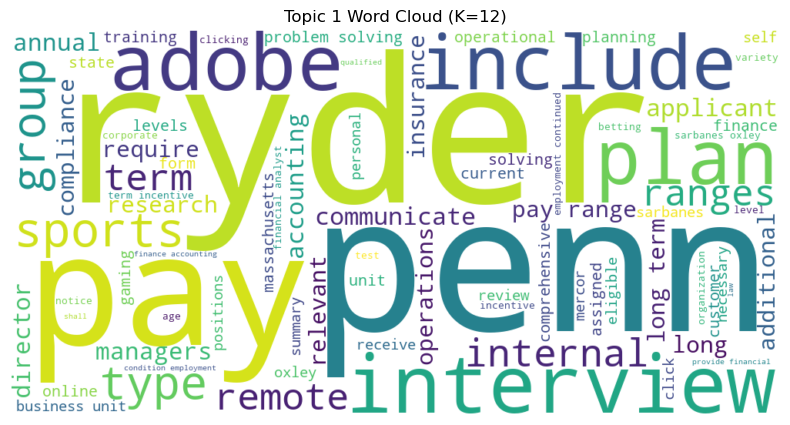

c:\Dickinson\Lib\site-packages\matplotlib\cbook.py:684: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.


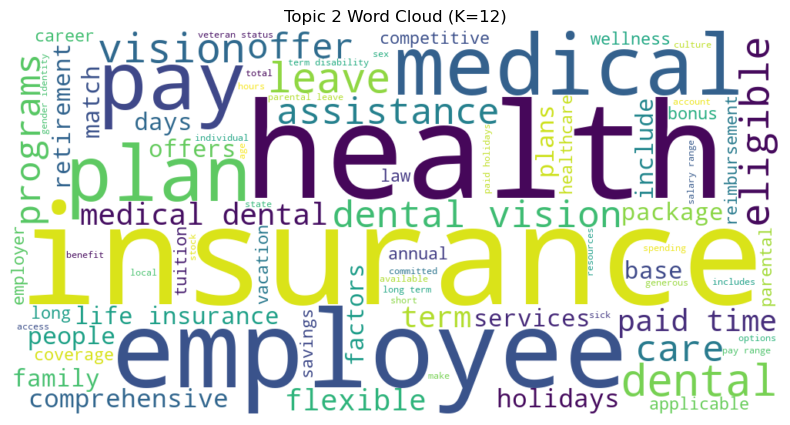

c:\Dickinson\Lib\site-packages\matplotlib\cbook.py:684: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.


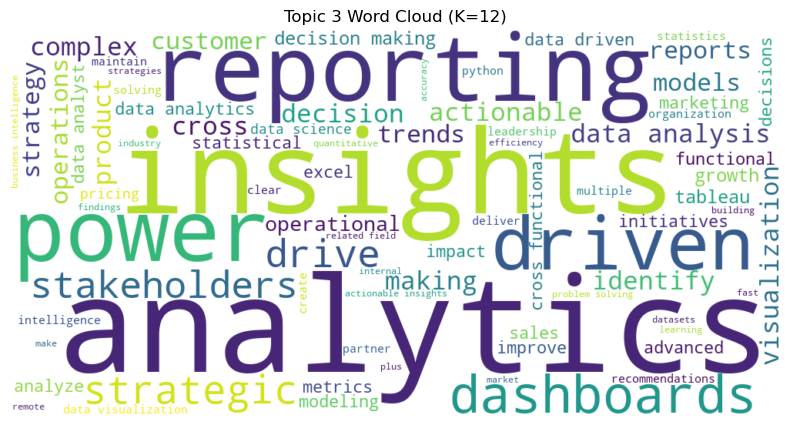

c:\Dickinson\Lib\site-packages\matplotlib\cbook.py:684: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.


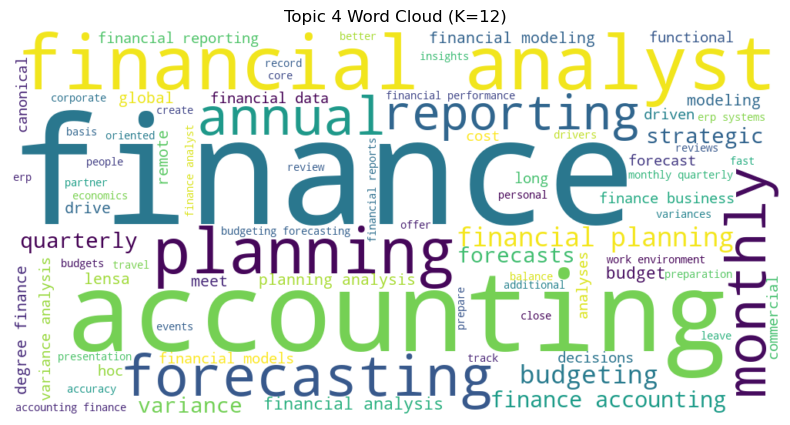

c:\Dickinson\Lib\site-packages\matplotlib\cbook.py:684: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.


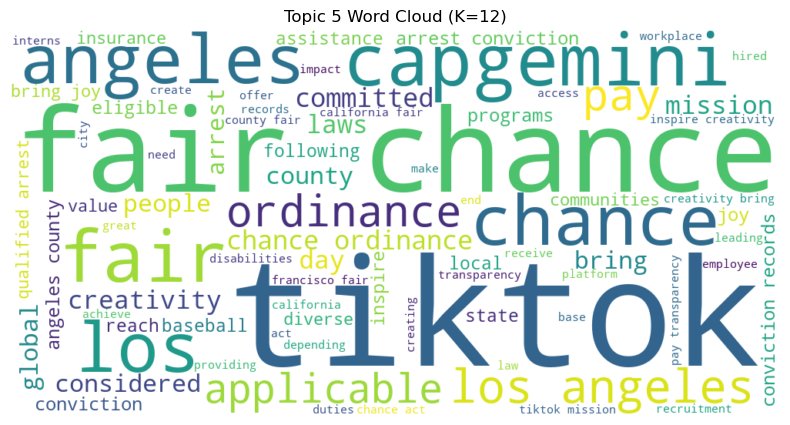

c:\Dickinson\Lib\site-packages\matplotlib\cbook.py:684: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.


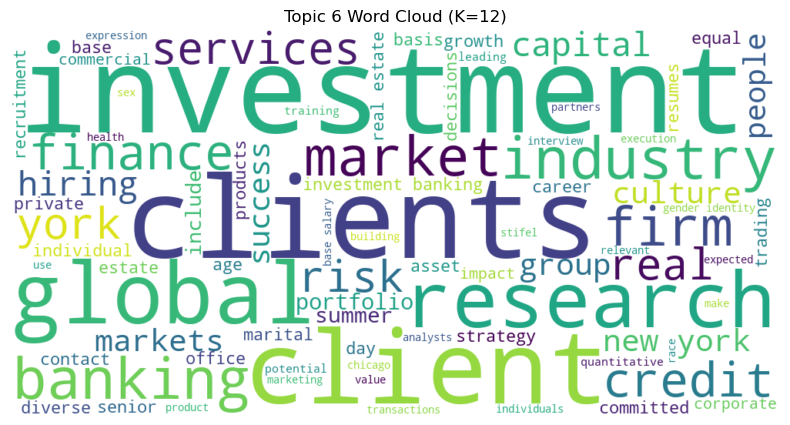

c:\Dickinson\Lib\site-packages\matplotlib\cbook.py:684: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.


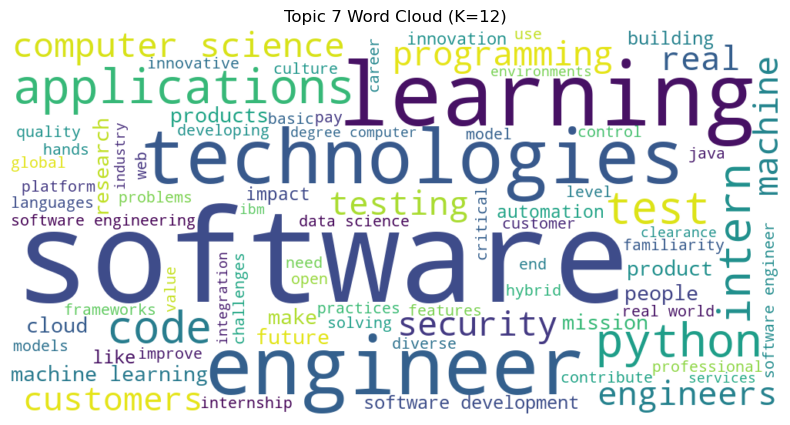

c:\Dickinson\Lib\site-packages\matplotlib\cbook.py:684: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.


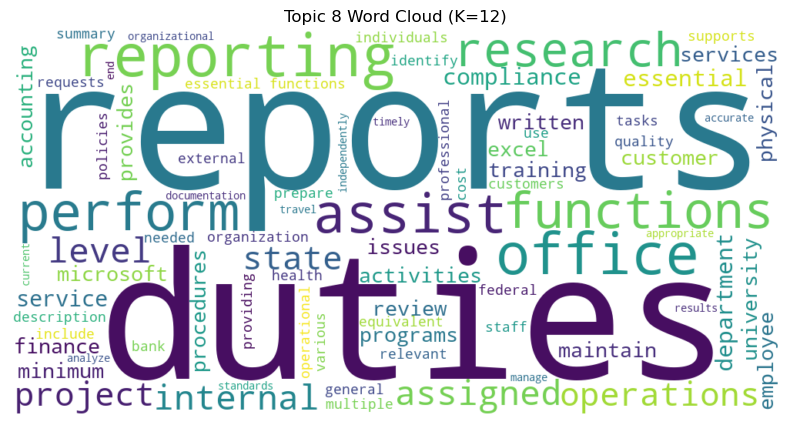

c:\Dickinson\Lib\site-packages\matplotlib\cbook.py:684: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.


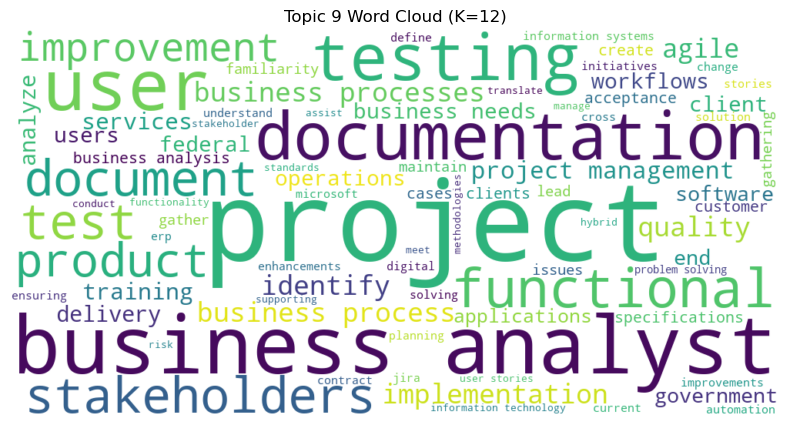

c:\Dickinson\Lib\site-packages\matplotlib\cbook.py:684: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.


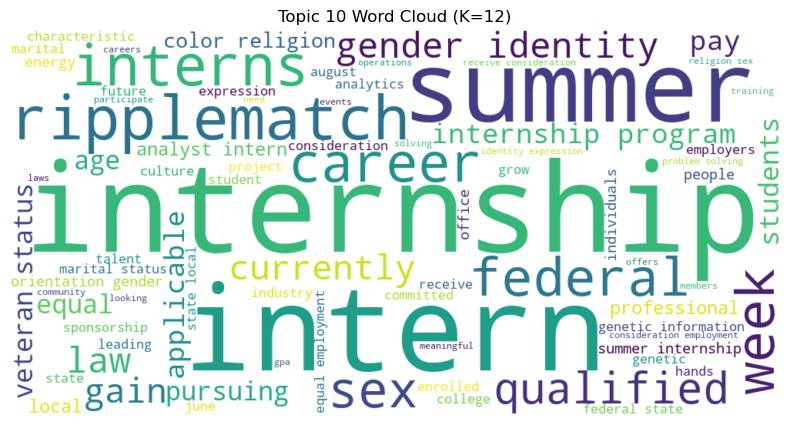

c:\Dickinson\Lib\site-packages\matplotlib\cbook.py:684: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.


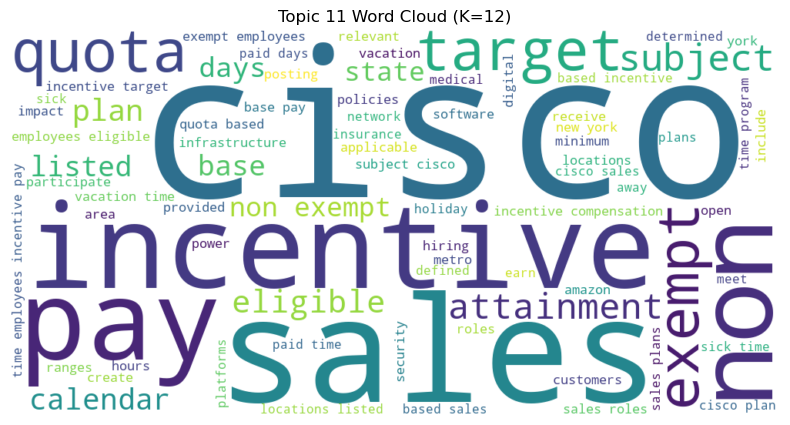

c:\Dickinson\Lib\site-packages\matplotlib\cbook.py:684: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.


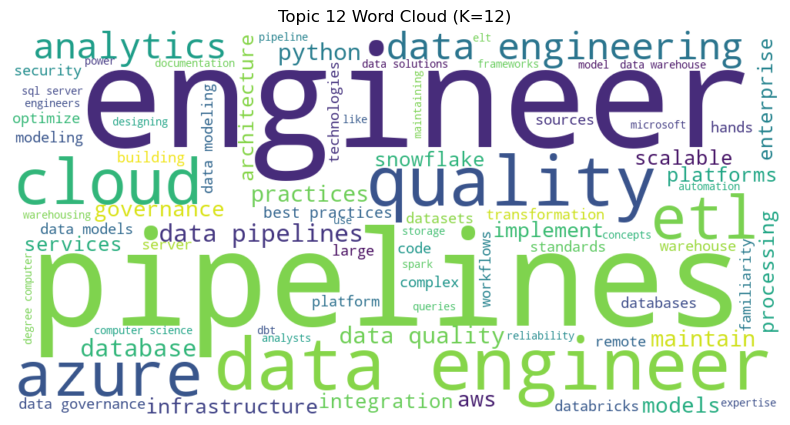

In [ ]:
# Word cloud per topic

terms = terms_best       # locked terms
beta = beta_best         # locked beta (K x V)

def topic_wordcloud(topic_idx, top_n=80):
    probs = beta[topic_idx]
    top_idx = np.argsort(probs)[::-1][:top_n]
    freqs = {terms[i]: float(probs[i]) for i in top_idx}

    wc = WordCloud(width=1000, height=500, background_color="white").generate_from_frequencies(freqs)
    plt.figure(figsize=(12, 5))
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title(f"Topic {topic_idx + 1} Word Cloud (K={BEST_K})")
    plt.show()

for k in range(BEST_K):
    topic_wordcloud(k)


c:\Dickinson\Lib\site-packages\matplotlib\cbook.py:684: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.


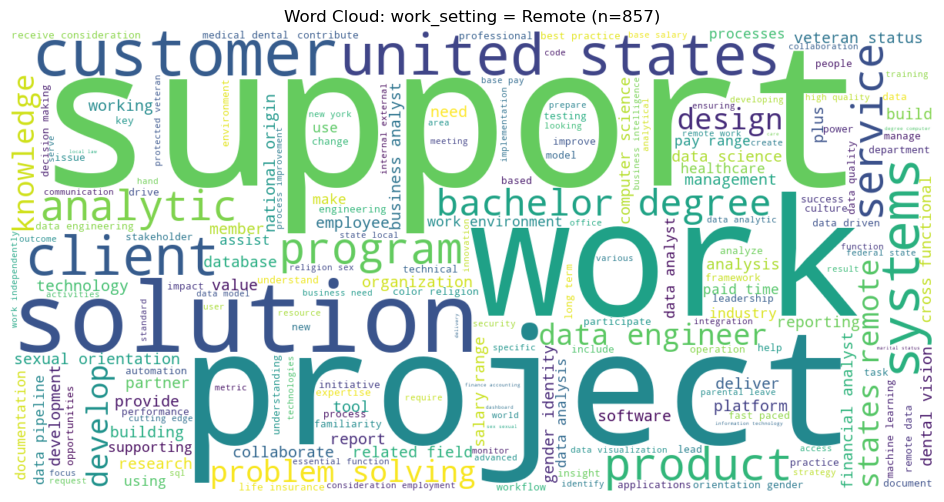

c:\Dickinson\Lib\site-packages\matplotlib\cbook.py:684: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.


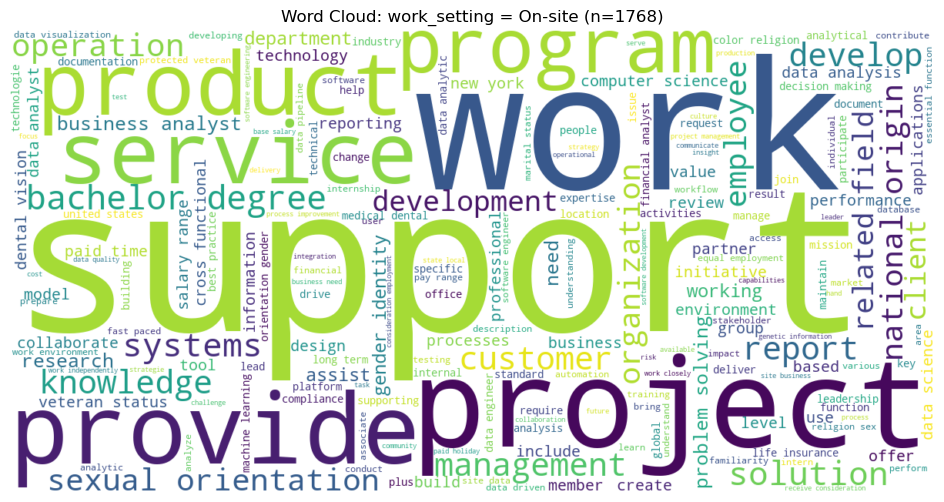

c:\Dickinson\Lib\site-packages\matplotlib\cbook.py:684: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.


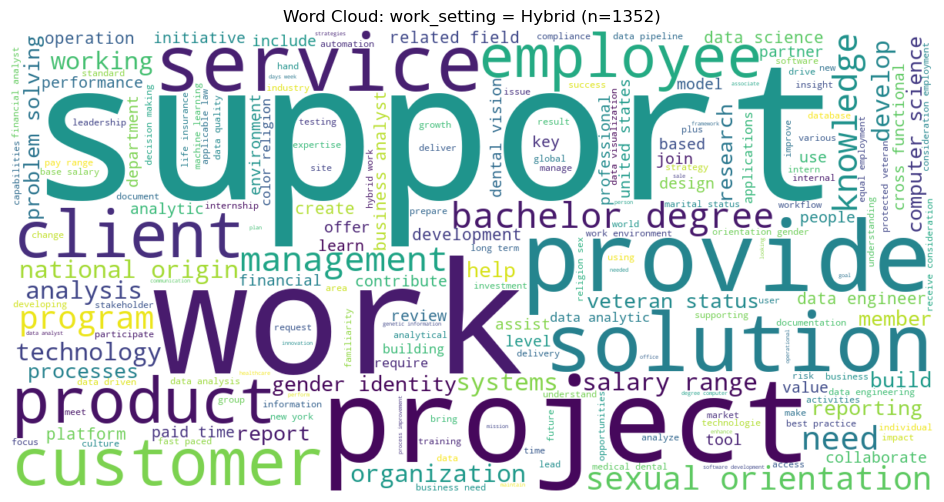

In [311]:
# Word clouds by work setting 

def group_wordcloud(df_in, group_col, group_value, text_col="text_for_NLP", max_words=200):
    subset = df_in[df_in[group_col].astype(str).str.strip().str.lower()
                   == str(group_value).strip().lower()].copy()

    if subset.empty:
        print(f"[NO MATCH] '{group_value}' not found in '{group_col}'. Available values:")
        print(df_in[group_col].value_counts(dropna=False).head(20))
        return

    text_series = subset[text_col].astype(str).fillna("").str.strip()
    text = " ".join(text_series.tolist()).strip()

    if len(text) == 0:
        print(f"[EMPTY TEXT] Matched rows: {len(subset)}, but '{text_col}' has no words after cleaning.")
        display(subset[[group_col, text_col]].head(5))
        return

    wc = WordCloud(width=1200, height=600, background_color="white", max_words=max_words).generate(text)

    plt.figure(figsize=(12, 6))
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title(f"Word Cloud: {group_col} = {group_value} (n={len(subset)})")
    plt.show()

# Use df_lda (aligned with dtm / lda_best)
group_wordcloud(df_lda, "work_setting", "Remote")
group_wordcloud(df_lda, "work_setting", "On-site")
group_wordcloud(df_lda, "work_setting", "Hybrid")


In [312]:
# Word clouds by level & industry 

def group_wordcloud(df_in, group_col, group_value, text_col="text_for_NLP",
                    max_words=200, min_chars=20):

    # normalize for matching
    gv = str(group_value).strip().lower()

    subset = df_in[
        df_in[group_col].fillna("Missing").astype(str).str.strip().str.lower() == gv
    ].copy()

    if subset.empty:
        print(f"[NO MATCH] '{group_value}' not found in '{group_col}'.")
        print(df_in[group_col].fillna("Missing").astype(str).value_counts().head(20))
        return

    text = " ".join(subset[text_col].astype(str).fillna("").tolist()).strip()

    if len(text) < min_chars:
        print(f"[EMPTY] {group_col}={group_value} matched {len(subset)} rows, but not enough text to plot.")
        return

    wc = WordCloud(width=1200, height=600, background_color="white", max_words=max_words).generate(text)

    plt.figure(figsize=(12, 6))
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title(f"Word Cloud: {group_col} = {group_value} (n={len(subset)})")
    plt.show()


def wordclouds_for_all_groups(df_in, group_col, text_col="text_for_NLP", max_words=200, top_k=None):
    """
    Makes a word cloud for each unique group value in df_in[group_col].
    If top_k is set, only plots the top_k most frequent groups.
    """
    counts = df_in[group_col].fillna("Missing").astype(str).str.strip().value_counts()
    groups = counts.index.tolist()[:top_k] if top_k else counts.index.tolist()

    print(f"Plotting {len(groups)} group word clouds for '{group_col}':")
    print(counts.head(20))

    for g in groups:
        group_wordcloud(df_in, group_col, g, text_col=text_col, max_words=max_words)



In [313]:
def standardize_seniority(x):
    x = str(x).lower()
    if any(k in x for k in ["intern", "new grad", "graduate", "entry", "junior"]):
        return "Entry / Early Career"
    if any(k in x for k in ["mid", "associate", "level 2", "ii", "intermediate"]):
        return "Mid-Level"
    if any(k in x for k in ["senior", "lead", "principal", "staff", "manager", "director", "vp", "head"]):
        return "Senior+"
    return "Unknown"

df["seniority_std"] = df["seniority_level"].apply(standardize_seniority)
df["seniority_std"].value_counts(dropna=False)

seniority_std
Senior+                 2377
Unknown                 1563
Mid-Level                249
Entry / Early Career     217
Name: count, dtype: int64

Plotting 3 group word clouds for 'seniority_level':
seniority_level
unknown          1454
lead              854
director_plus     609
manager           473
senior            441
mid               249
entry             217
new_grad          109
Name: count, dtype: int64


c:\Dickinson\Lib\site-packages\matplotlib\cbook.py:684: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.


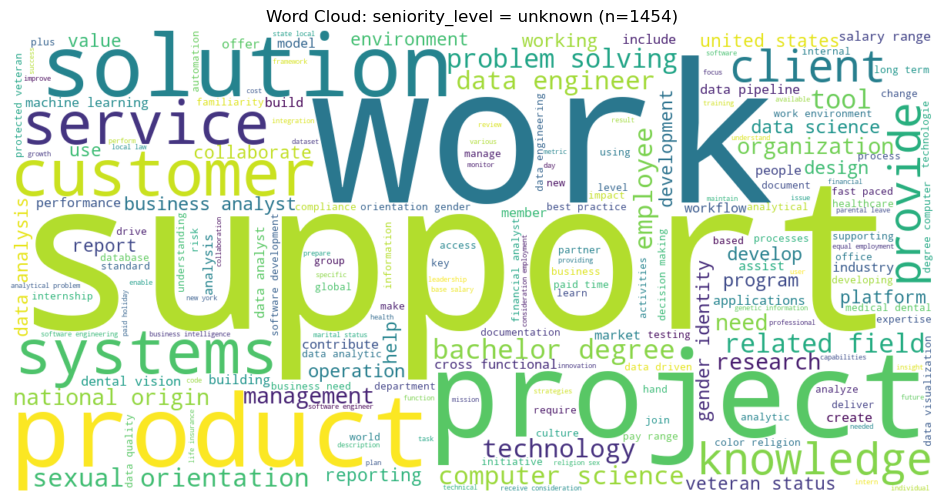

c:\Dickinson\Lib\site-packages\matplotlib\cbook.py:684: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.


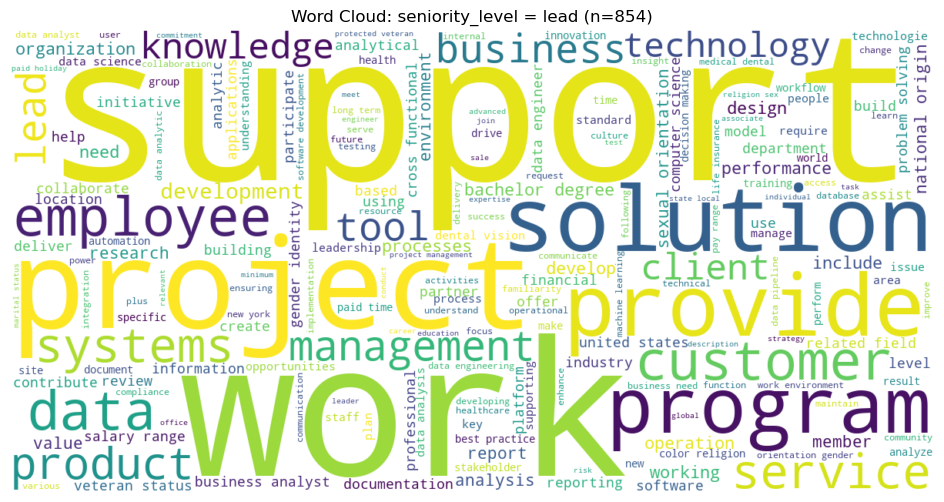

c:\Dickinson\Lib\site-packages\matplotlib\cbook.py:684: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.


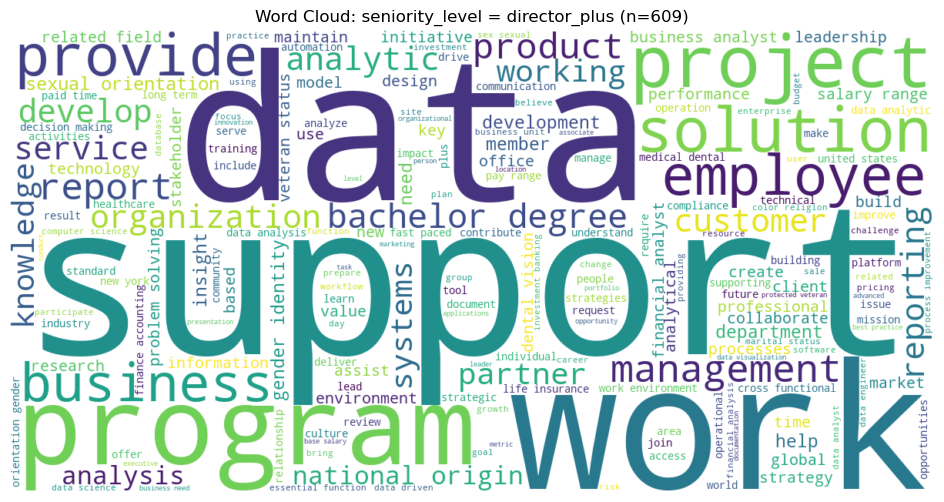

Plotting 8 group word clouds for 'industry':
industry
Data / AI / Analytics           1973
Finance / Banking                684
Software / Engineering           675
IT / Cloud / Security            609
Marketing / Growth               103
Consulting / Strategy            100
Accounting / Audit                76
Other / Mixed                     49
Operations / Supply Chain         36
Healthcare / Clinical             28
Education / Research              19
Human Resources / Recruiting      14
Sales / Business Development      13
Media / Communications            12
Government / Nonprofit             5
Product Management                 4
UX / UI / Design                   2
Customer Success / Support         2
Pharma / Biotech                   2
Name: count, dtype: int64


c:\Dickinson\Lib\site-packages\matplotlib\cbook.py:684: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.


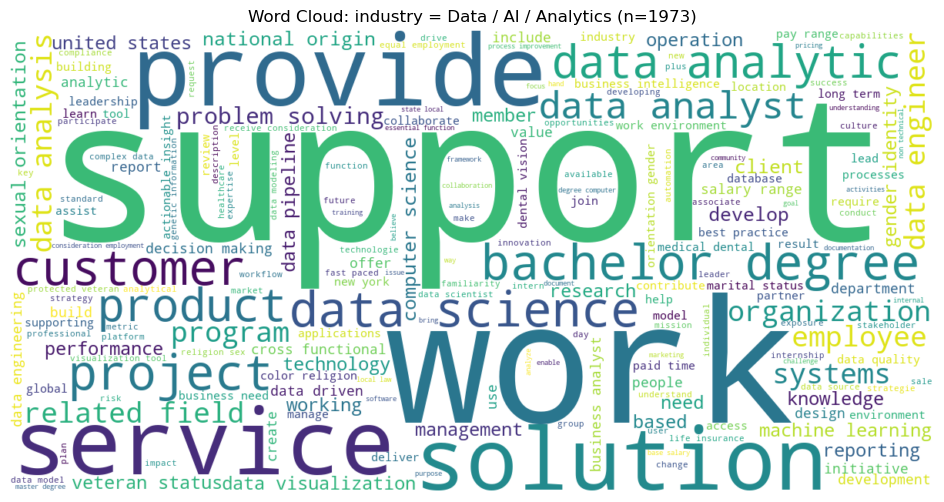

c:\Dickinson\Lib\site-packages\matplotlib\cbook.py:684: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.


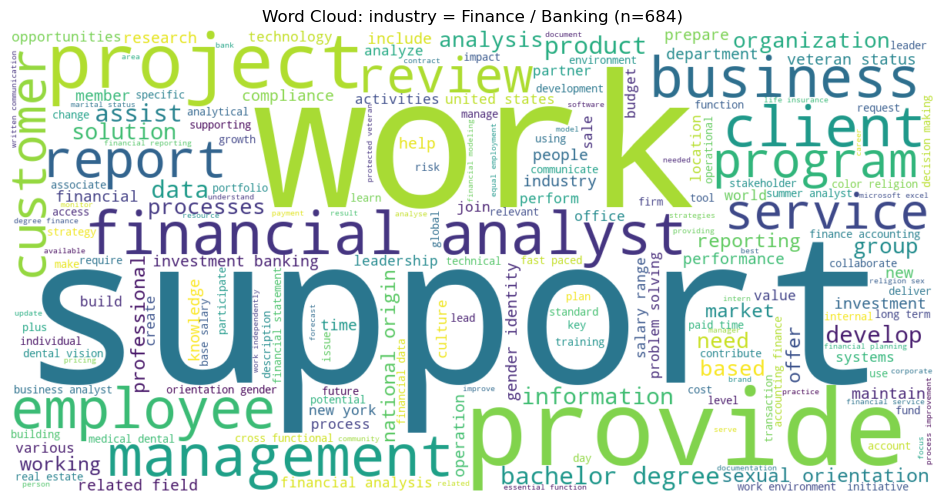

c:\Dickinson\Lib\site-packages\matplotlib\cbook.py:684: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.


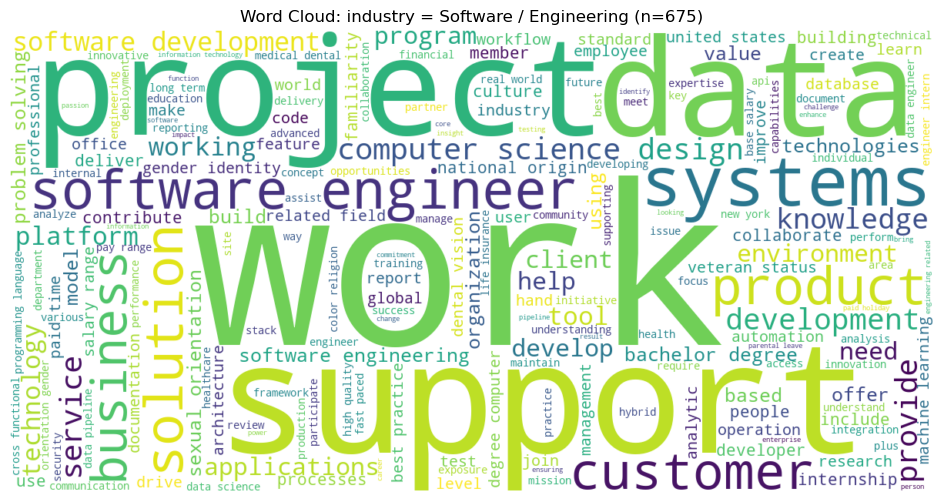

c:\Dickinson\Lib\site-packages\matplotlib\cbook.py:684: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.


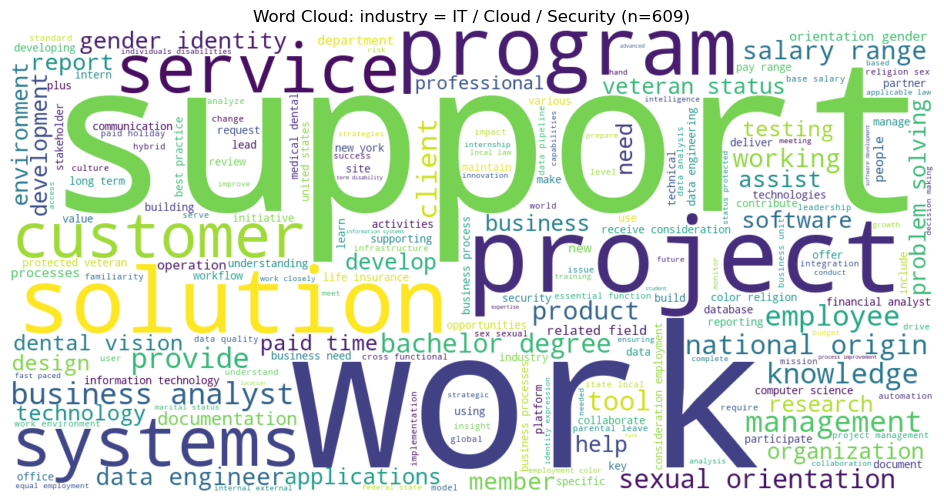

c:\Dickinson\Lib\site-packages\matplotlib\cbook.py:684: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.


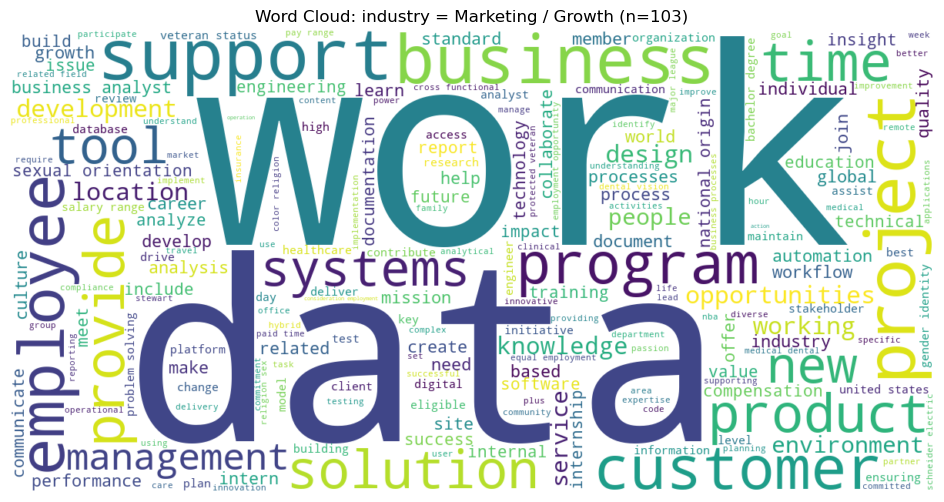

c:\Dickinson\Lib\site-packages\matplotlib\cbook.py:684: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.


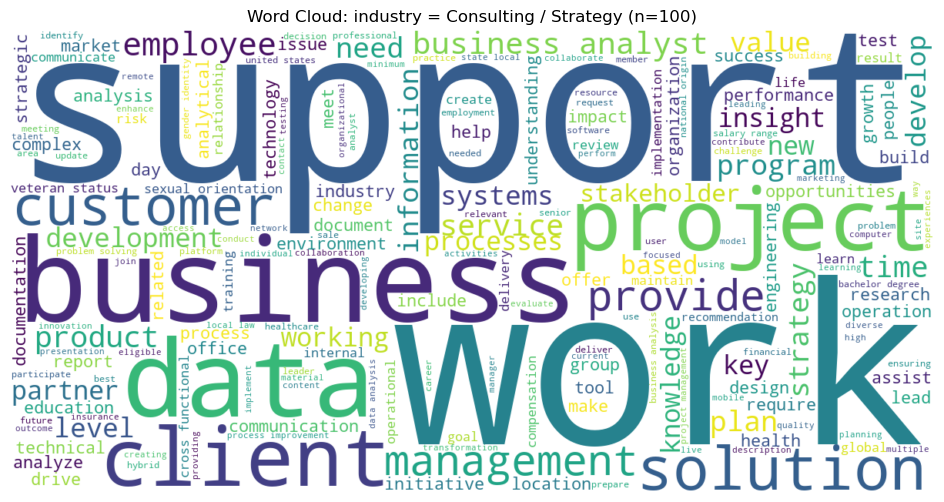

c:\Dickinson\Lib\site-packages\matplotlib\cbook.py:684: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.


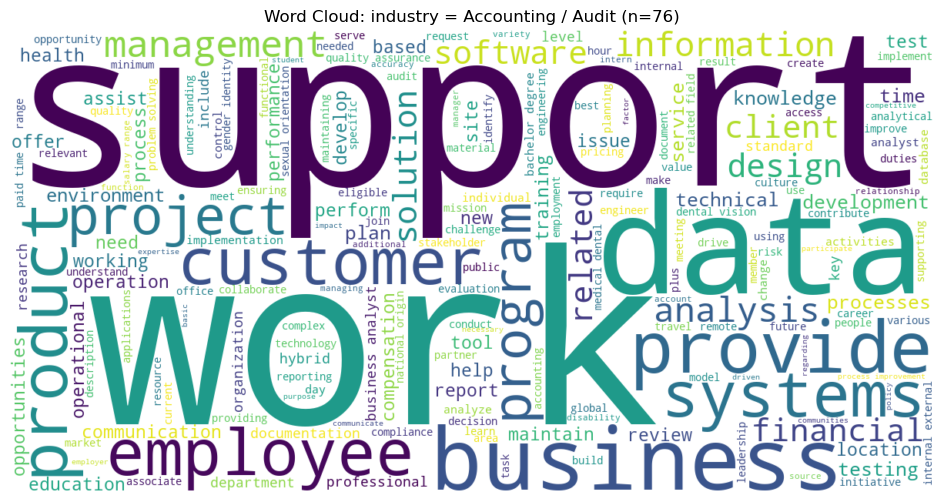

c:\Dickinson\Lib\site-packages\matplotlib\cbook.py:684: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.


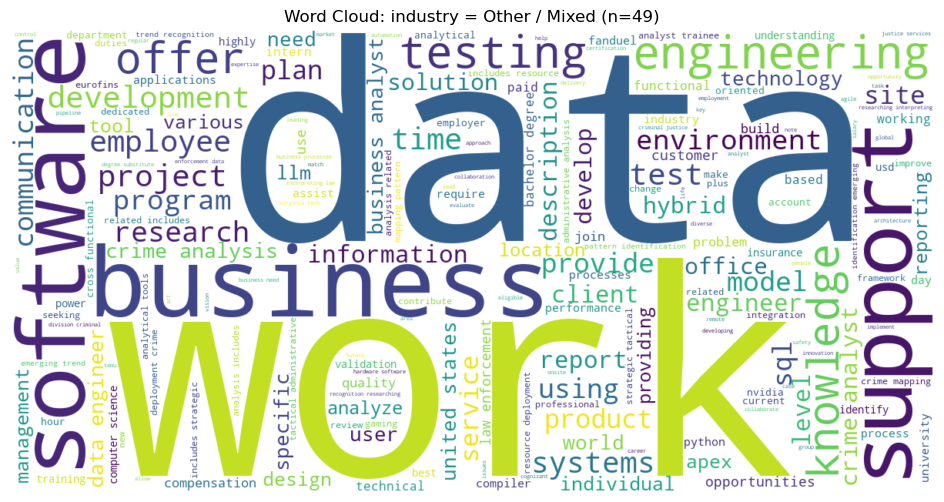

In [314]:
wordclouds_for_all_groups(df_lda, "seniority_level", text_col="text_for_NLP", max_words=200, top_k=3)
wordclouds_for_all_groups(df_lda, "industry", text_col="text_for_NLP", max_words=200, top_k=8)


In [324]:
# Interactive topic visualization (PyLDAvis)

import pyLDAvis
import pyLDAvis.lda_model

vis = pyLDAvis.lda_model.prepare(lda_best, dtm, vectorizer, sort_topics=False)
pyLDAvis.display(vis)

pyLDAvis.save_html(vis, "lda_topics_K12.html")

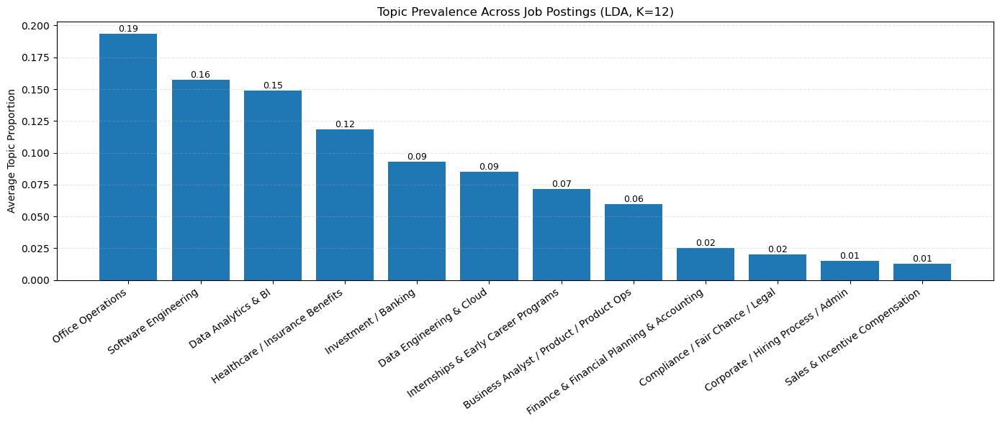

In [325]:
# Topic prevalence across job postings 

# Topic labels (keep as-is)
topic_labels = { 
    0: "Corporate / Hiring Process / Admin",
    1: "Healthcare / Insurance Benefits",
    2: "Data Analytics & BI",
    3: "Finance & Financial Planning & Accounting",
    4: "Compliance / Fair Chance / Legal",
    5: "Investment / Banking",
    6: "Software Engineering",
    7: "Office Operations",
    8: "Business Analyst / Product / Product Ops",
    9: "Internships & Early Career Programs",
    10: "Sales & Incentive Compensation",
    11: "Data Engineering & Cloud"
}

# Compute topic prevalence (use locked theta)
# Option A (recommended): use theta_best you already computed
topic_prevalence = theta_best.mean(axis=0)

# Option B (equivalent): recompute from locked model
# theta_best = lda_best.transform(dtm)
# topic_prevalence = theta_best.mean(axis=0)

topics = list(range(len(topic_prevalence)))
labels = [topic_labels.get(k, f"Topic {k+1}") for k in topics]

sorted_idx = np.argsort(topic_prevalence)[::-1]
sorted_prevalence = topic_prevalence[sorted_idx]
sorted_labels = [labels[i] for i in sorted_idx]

plt.figure(figsize=(14, 6))
bars = plt.bar(sorted_labels, sorted_prevalence)

plt.ylabel("Average Topic Proportion")
plt.title(f"Topic Prevalence Across Job Postings (LDA, K={BEST_K})")
plt.xticks(rotation=35, ha="right")
plt.grid(axis="y", linestyle="--", alpha=0.3)

for bar in bars:
    h = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, h, f"{h:.2f}",
             ha="center", va="bottom", fontsize=9)

plt.tight_layout()
plt.show()


In [327]:
# Topic-by-group comparisons (stacked bars) 

theta = theta_best  # (n_docs, BEST_K) aligned with dtm rows
topic_cols = [f"topic_{k+1}" for k in range(theta.shape[1])]  # nicer 1-based names

topic_df = pd.DataFrame(theta, columns=topic_cols, index=df_lda.index)

# IMPORTANT: use df_lda (aligned with dtm), not df
df_topics = pd.concat(
    [df_lda.reset_index(drop=True), topic_df.reset_index(drop=True)],
    axis=1
)


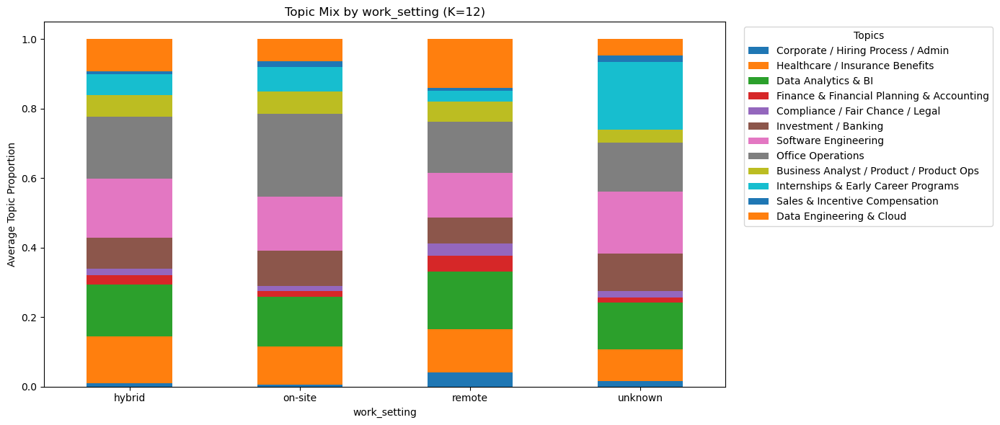

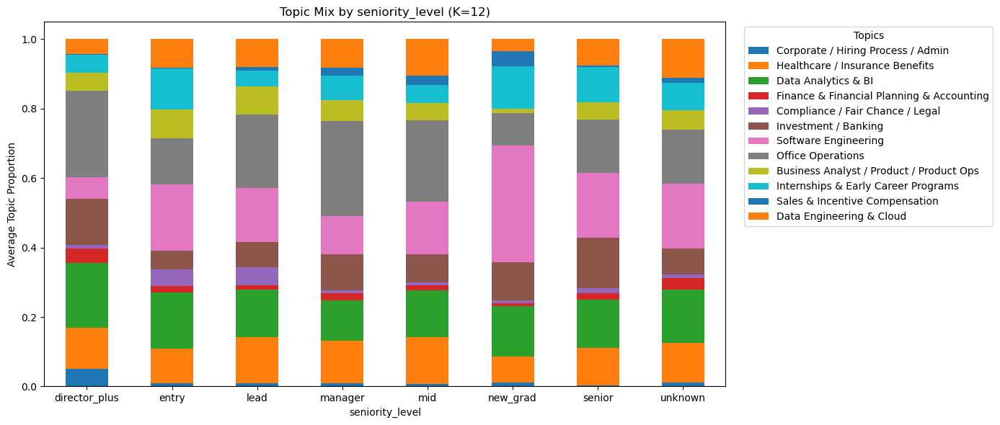

,Corporate / Hiring Process / Admin,Healthcare / Insurance Benefits,Data Analytics & BI,Finance & Financial Planning & Accounting,Compliance / Fair Chance / Legal,Investment / Banking,Software Engineering,Office Operations,Business Analyst / Product / Product Ops,Internships & Early Career Programs,Sales & Incentive Compensation,Data Engineering & Cloud
seniority_level,,,,,,,,,,,,
director_plus,0.051545,0.117769,0.187243,0.041345,0.008611,0.133947,0.062362,0.247974,0.053254,0.050243,0.002423,0.043286
entry,0.009576,0.098412,0.163435,0.018269,0.047450,0.052914,0.192039,0.132307,0.082891,0.118991,0.001101,0.082615
lead,0.009255,0.133200,0.136229,0.013147,0.051906,0.072507,0.154841,0.211202,0.081451,0.046588,0.009130,0.080544
manager,0.009028,0.122648,0.116506,0.020369,0.008731,0.104142,0.109858,0.274124,0.058578,0.070227,0.023483,0.082308
mid,0.006463,0.136039,0.134526,0.014816,0.008041,0.080118,0.152506,0.234014,0.049778,0.051850,0.027847,0.104004
new_grad,0.010259,0.075958,0.144892,0.007763,0.008713,0.110258,0.335888,0.093485,0.012437,0.122459,0.044000,0.033889
senior,0.004014,0.106844,0.139584,0.017987,0.013678,0.147007,0.185561,0.153603,0.050489,0.100580,0.005336,0.075318
unknown,0.010509,0.114707,0.154415,0.032559,0.011018,0.074036,0.187670,0.155099,0.054500,0.079897,0.014862,0.110728


In [328]:

# Sanity checks 
assert theta_best.shape[1] == BEST_K, "theta_best does not match BEST_K"
assert len(df_lda) == theta_best.shape[0], "df_lda rows must match theta_best rows"

# Topic labels
topic_labels = {
    0: "Corporate / Hiring Process / Admin",
    1: "Healthcare / Insurance Benefits",
    2: "Data Analytics & BI",
    3: "Finance & Financial Planning & Accounting",
    4: "Compliance / Fair Chance / Legal",
    5: "Investment / Banking",
    6: "Software Engineering",
    7: "Office Operations",
    8: "Business Analyst / Product / Product Ops",
    9: "Internships & Early Career Programs",
    10: "Sales & Incentive Compensation",
    11: "Data Engineering & Cloud"
}

# Build df_topics (aligned: df_lda + theta_best) 
topic_cols = [f"topic_{i}" for i in range(BEST_K)]  # 0-based topic columns

topic_df = pd.DataFrame(theta_best, columns=topic_cols, index=df_lda.index)

df_topics = pd.concat(
    [df_lda.reset_index(drop=True), topic_df.reset_index(drop=True)],
    axis=1
)

# Function to plot stacked topic mix by any group column 
def stacked_topic_mix(df_topics, group_col, topic_cols, topic_labels, min_group_n=1):
    # Keep missing as "Missing" so it appears in plot
    tmp = df_topics.copy()
    tmp[group_col] = tmp[group_col].fillna("Missing").astype(str).str.strip().str.lower()

    # Optionally filter tiny groups
    group_counts = tmp[group_col].value_counts()
    keep_groups = group_counts[group_counts >= min_group_n].index
    tmp = tmp[tmp[group_col].isin(keep_groups)]

    # Aggregate topic proportions
    mix = tmp.groupby(group_col)[topic_cols].mean()

    # Bulletproof renaming: rename by column POSITION (prevents duplicates)
    mix.columns = [topic_labels[i] for i in range(len(topic_cols))]

    # Plot
    ax = mix.plot(kind="bar", stacked=True, figsize=(14, 6))
    ax.set_ylabel("Average Topic Proportion")
    ax.set_title(f"Topic Mix by {group_col} (K={BEST_K})")
    ax.legend(title="Topics", bbox_to_anchor=(1.02, 1), loc="upper left")
    plt.xticks(rotation=0)
    plt.tight_layout()
    plt.show()

    return mix  # optional: returns the aggregated table

# Run plots
stacked_topic_mix(df_topics, "work_setting", topic_cols, topic_labels)
stacked_topic_mix(df_topics, "seniority_level", topic_cols, topic_labels)
